# M5 Forecasting - Accuracy

## Kaggle link:
https://www.kaggle.com/competitions/m5-forecasting-accuracy/overview

## Goal:
Predict item sales at Walmart stores in various locations for the next 28 days.

## Data:
The data comprises 
- 3049 individual products 
- from 3 categories (FOODS, HOUSEHOLD, HOBBIES) 
- and 7 departments (Department Hobbies 1, Department Hobbies 2, Department Foods 1, Department Foods 2, Departmenet Foods 3, Department Household 1, Department Household 2), 
- sold in 10 stores in 3 US states (California, Texas, and Wisconsin). 

**sales_train_validation.csv**: 
- contains the historical daily unit sales data per product and store [d_1 - d_1913].
- training and validation have 1941 days in total from 2011-01-29 and 2016-05-22. 
- [d_1914 - d_1941] represents the validation rows which we will predict in stage 1.
- [d_1942 - d_1969] represents the evaluation rows which we will predict for the final competition standings (from 2016-05-23 to 2016-06-19).

**sell_prices.csv**: contains information about the price of the products sold per store and date.

**calendar.csv**: contains dates together with related features like day-of-the week, month, year, and 3 binary flags for whether the stores in each state allowed purchases with SNAP food stamps at this date (1) or not (0).

## Contents

1. **Section I Exploratory Data Analysis**: This section does comprehensive Exploratory Data Analysis (EDA) for the given time-series database. 

2. **Section II Baisc Statistical Time-Series Models**: This section contains various statistical time-series models implementation: Naive, Moving Average, Holt Exponential Smoothing, Winter Exponential Smoothing, ARIMA & Prophet

3. **Section III LSTM**: This section contains the implementation for RNN-LSTM to forecast time-series data.

4. **Section IV LightGBM**: This section contains the implementation for Boosting technique LightGBM to forecast time-series data.

5. **Section V Time-Series Statistics**: This section contains the basics of how to identify trends and seasonality in time-series. It contains various method of removing seasonality and trends before applying into statistical models like ARIMA.

## <span style='color:blue'> *Section I Exploratory Data Analysis (EDA)* </span>

**This section does comprehensive EDA for the given time-series database.**

### Import necessary libraries

In [1]:
import numpy as np
import pandas as pd

# For plotting and visualization
import matplotlib.pyplot as plt
import seaborn as sns
from itertools import cycle

import pywt # for denoising time-series wavelet
# install pywt: pip install PyWavelets

from statsmodels.tsa.arima_model import ARIMA
from statsmodels.tsa.api import ExponentialSmoothing, SimpleExpSmoothing, Holt
# pip install statsmodels
from tqdm.notebook import tqdm as tqdm
# pip install tqdm

from fbprophet import Prophet
# python version = 3.8.5
"""
installation:
conda install -c anaconda ephem
conda install -c conda-forge pysta
conda install -c conda-forge fbprophet
"""

from datetime import datetime, timedelta
import gc
import lightgbm as lgb
# conda install lightgbm

# Basic setup
# pd.set_option('display.max_columns', 50)
plt.style.use('bmh')
color_pal=plt.rcParams['axes.prop_cycle'].by_key()['color']
color_cycle=cycle(plt.rcParams['axes.prop_cycle'].by_key()['color'])

# Ignore warnings
import warnings
warnings.filterwarnings('ignore')

### Read the data

In [2]:
INPUT_DIR = 'm5-forecasting-accuracy-data/'
cal_data = pd.read_csv(INPUT_DIR + 'calendar.csv')
price_data = pd.read_csv(INPUT_DIR + 'sell_prices.csv')
stv_data = pd.read_csv(INPUT_DIR + 'sales_train_validation.csv')
ss_data = pd.read_csv(INPUT_DIR + 'sample_submission.csv')

### View the data

In [3]:
cal_data.tail()

,date,wm_yr_wk,weekday,wday,month,year,d,event_name_1,event_type_1,event_name_2,event_type_2,snap_CA,snap_TX,snap_WI
1964,2016-06-15,11620,Wednesday,5,6,2016,d_1965,NaN,NaN,NaN,NaN,0,1,1
1965,2016-06-16,11620,Thursday,6,6,2016,d_1966,NaN,NaN,NaN,NaN,0,0,0
1966,2016-06-17,11620,Friday,7,6,2016,d_1967,NaN,NaN,NaN,NaN,0,0,0
1967,2016-06-18,11621,Saturday,1,6,2016,d_1968,NaN,NaN,NaN,NaN,0,0,0
1968,2016-06-19,11621,Sunday,2,6,2016,d_1969,NBAFinalsEnd,Sporting,Father's day,Cultural,0,0,0


In [4]:
price_data.head()

,store_id,item_id,wm_yr_wk,sell_price
0,CA_1,HOBBIES_1_001,11325,9.58
1,CA_1,HOBBIES_1_001,11326,9.58
2,CA_1,HOBBIES_1_001,11327,8.26
3,CA_1,HOBBIES_1_001,11328,8.26
4,CA_1,HOBBIES_1_001,11329,8.26


In [5]:
stv_data.shape

(30490, 1919)

In [6]:
stv_data.describe()

,d_1,d_2,d_3,d_4,d_5,d_6,d_7,d_8,d_9,d_10,...,d_1904,d_1905,d_1906,d_1907,d_1908,d_1909,d_1910,d_1911,d_1912,d_1913
count,30490.000000,30490.000000,30490.000000,30490.000000,30490.000000,30490.000000,30490.000000,30490.000000,30490.000000,30490.000000,...,30490.000000,30490.000000,30490.000000,30490.000000,30490.000000,30490.000000,30490.000000,30490.000000,30490.000000,30490.000000
mean,1.070220,1.041292,0.780026,0.833454,0.627944,0.958052,0.918662,1.244080,1.073663,0.838701,...,1.370581,1.586159,1.693670,1.248245,1.232207,1.159167,1.149000,1.328862,1.605838,1.633158
std,5.126689,5.365468,3.667454,4.415141,3.379344,4.785947,5.059495,6.617729,5.917204,4.206199,...,3.740017,4.097191,4.359809,3.276925,3.125471,2.876026,2.950364,3.358012,4.089422,3.812248
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,1.000000,2.000000,2.000000,1.000000,1.000000,1.000000,1.000000,1.000000,2.000000,2.000000
max,360.000000,436.000000,207.000000,323.000000,296.000000,314.000000,316.000000,370.000000,385.000000,353.000000,...,129.000000,160.000000,204.000000,98.000000,100.000000,88.000000,77.000000,141.000000,171.000000,130.000000


In [7]:
stv_data.head()

,id,item_id,dept_id,cat_id,store_id,state_id,d_1,d_2,d_3,d_4,...,d_1904,d_1905,d_1906,d_1907,d_1908,d_1909,d_1910,d_1911,d_1912,d_1913
0,HOBBIES_1_001_CA_1_validation,HOBBIES_1_001,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,1,3,0,1,1,1,3,0,1,1
1,HOBBIES_1_002_CA_1_validation,HOBBIES_1_002,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
2,HOBBIES_1_003_CA_1_validation,HOBBIES_1_003,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,2,1,2,1,1,1,0,1,1,1
3,HOBBIES_1_004_CA_1_validation,HOBBIES_1_004,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,1,0,5,4,1,0,1,3,7,2
4,HOBBIES_1_005_CA_1_validation,HOBBIES_1_005,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,2,1,1,0,1,1,2,2,2,4


In [8]:
ss_data.head()

,id,F1,F2,F3,F4,F5,F6,F7,F8,F9,...,F19,F20,F21,F22,F23,F24,F25,F26,F27,F28
0,HOBBIES_1_001_CA_1_validation,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,HOBBIES_1_002_CA_1_validation,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,HOBBIES_1_003_CA_1_validation,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,HOBBIES_1_004_CA_1_validation,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,HOBBIES_1_005_CA_1_validation,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


We are trying for forecast sales for 28 forecast days (from 2016-05-23 to 2016-06-19). The sample submission has the following format:
- The columns represent 28 forecast days. We will fill these forecast days with our predictions.
- The rows each represent a specific item. This id tells us the item type, state, and store. We don't know what these items are exactly.

### Visualization

1. Plot the sales for a specific item to view the trend.

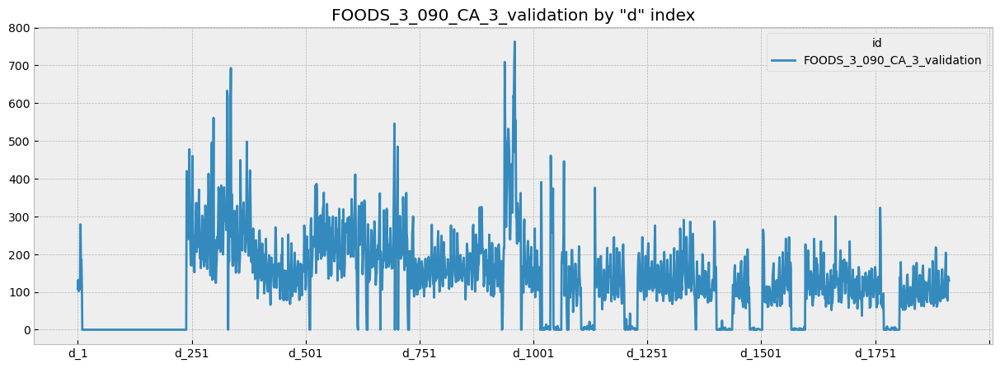

In [9]:
d_idx = [col for col in stv_data.columns if 'd_' in col] # get the date index

# Select a particular item, e.g., 'FOODS_3_090_CA_3_validation'
# Set 'id' as index with sales data column starting with d_
# Transpose so that the dataframe is a column
# Plot the data
item = stv_data.loc[stv_data['id'] == 'FOODS_3_090_CA_3_validation'].set_index('id')[d_idx].T
item.plot(figsize=(15, 5), title='FOODS_3_090_CA_3_validation by "d" index', color=next(color_cycle));

2. Merging the data with real dates.

We are given a calendar with additional information about real dates. The calendar data can be merged with the date index data.

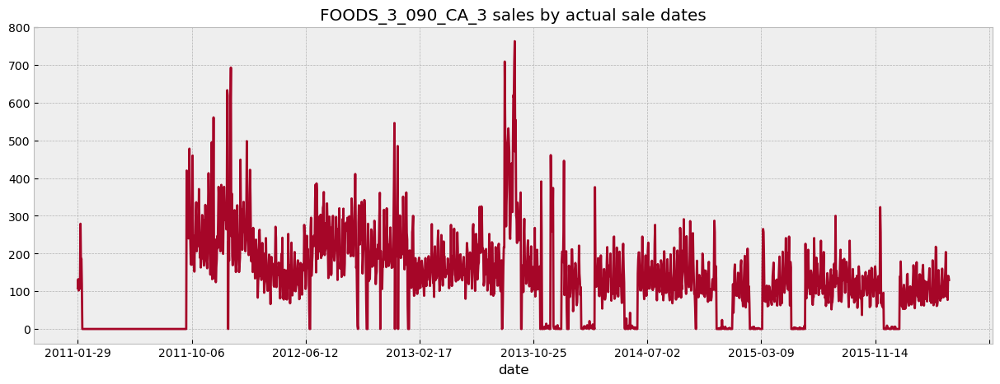

In [10]:
# Create a specific example for an item Id

# Merge calendar on the items' data
# Select a particular item, e.g., 'FOODS_3_090_CA_3_validation'
# Set 'id' as index with sales data column starting with d_
# Transpose so that the dataframe is a column
example = stv_data.loc[stv_data['id'] == 'FOODS_3_090_CA_3_validation'][d_idx].T
example = example.rename(columns={8412: 'FOODS_3_090_CA_3'}) # Name it correcty
example = example.reset_index().rename(columns={'index': 'd'}) # make the index "d"
example = example.merge(cal_data, how='left', validate='1:1')

example.set_index('date')['FOODS_3_090_CA_3'] \
    .plot(figsize=(15, 5),
          title='FOODS_3_090_CA_3 sales by actual sale dates',
          color=next(color_cycle));

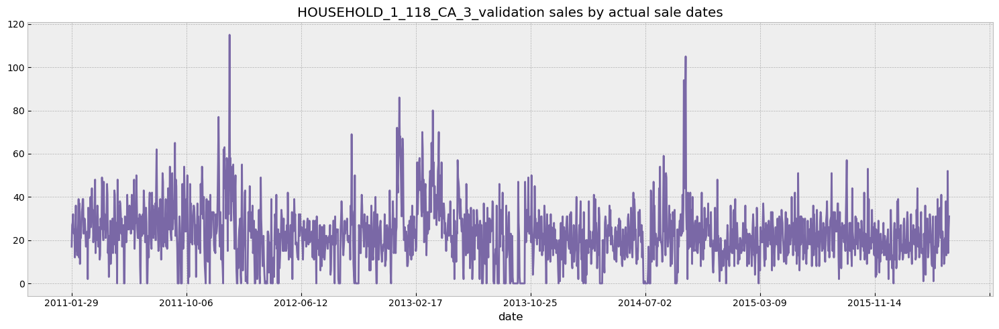

In [12]:
# Create several examples simultaneously 

ids = ['FOODS_3_090_CA_3_validation', 'HOBBIES_1_234_CA_3_validation', 'HOUSEHOLD_1_118_CA_3_validation', 'HOBBIES_1_001_CA_1_validation']
examples = []

# General function to extract specific item Id values from sales_train_evaluation dataset
for i in range(len(ids)):
    # Merge calendar date with sales_train_evaluation date
    examples.append(stv_data.loc[stv_data['id']== ids[i]][d_idx].T) # Fetch a specific Id and transform it as column
    examples[i] = examples[i].rename(columns={examples[i].columns.values[0] : ids[i]}) # Rename column e.g 8412 (location Id) to the proper name
    examples[i] = examples[i].reset_index().rename(columns={'index':'d'}) # Reset index so, d_cols are not index and then, rename index as d
    examples[i] = examples[i].merge(cal_data) # Merge two dataframe on the bases of column named d


graph_ids = [2] # a specific item
# graph_ids = list(range(len(ids)))
fig, axs = plt.subplots(len(graph_ids),1,figsize=(15,10)) 
if len(graph_ids) != 1 : axs=axs.flatten() 

ax_id=0
for graph_id in graph_ids:
    # Set date as the index of dataframe to be plotted properly and only fetch specific Id sales value
    examples[graph_id].set_index('date')[ids[graph_id]] \
    .plot(figsize=(15,5), color=next(color_cycle), title= f'{ids[graph_id]} sales by actual sale dates', ax=axs[ax_id] if len(graph_ids)!=1 else axs)
    
    ax_id+=1
plt.tight_layout()
plt.show()

3. Zooming technique: plot a certain period of data

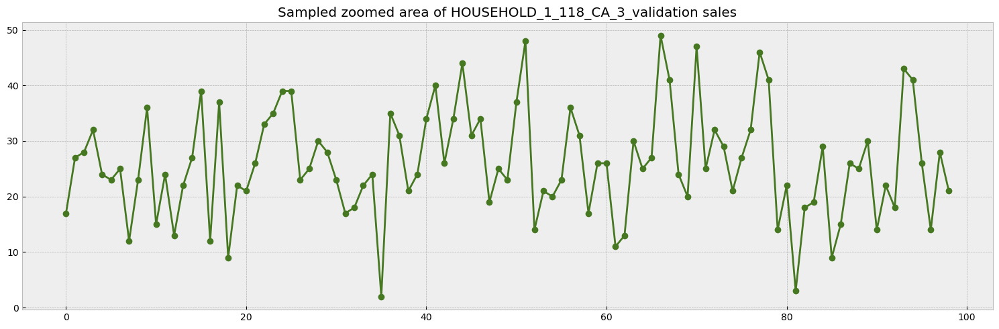

In [13]:
fig, axs = plt.subplots(len(graph_ids), 1, figsize=(15,10)) 
if len(graph_ids) != 1 : 
    axs = axs.flatten() 

ax_id = 0
for graph_id in graph_ids:
    examples[graph_id][0:99][ids[graph_id]].plot(figsize=(15,5),color=next(color_cycle), marker='o',
                                                title=f'Sampled zoomed area of {ids[graph_id]} sales', ax=axs[ax_id] if len(graph_ids)!=1 else axs)
    ax_id+=1
plt.tight_layout()
plt.show()

4. Denoise data to view underlying trends.

4.1 **Wavelet denoising** - calculate wavelet coefficients and discard low coefficients

In [14]:
# Return mean absolute deviation value
def mean_abs_dev(d, axis=None):
    return np.mean(np.absolute(d - np.mean(d, axis)), axis)

# Denoise the signal
def denoise(x, wavelet='db4', level=1):
    coeff = pywt.wavedec(x, wavelet, mode='per')
    sigma = (1/0.6745) * mean_abs_dev(coeff[-level])
    
    uthresh = sigma * np.sqrt (2 * np.log(len(x)))
    coeff[1:] = (pywt.threshold(i, value = uthresh, mode='hard') for i in coeff[1:])
    return pywt.waverec(coeff, wavelet, mode='per')

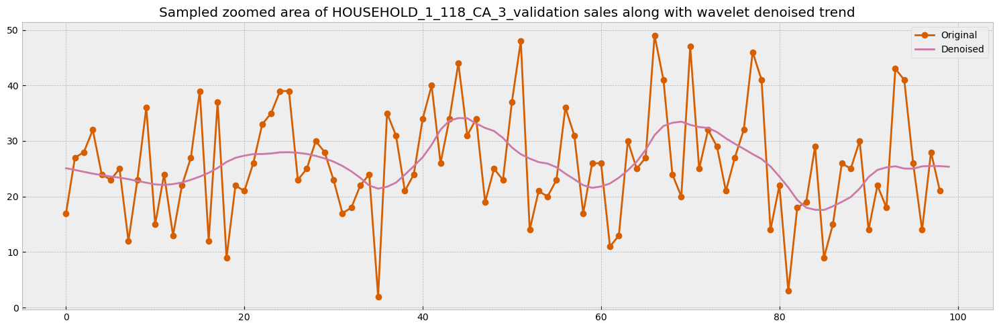

In [15]:
fig, axs = plt.subplots(len(graph_ids), 1, figsize=(15,10)) 
if len(graph_ids) != 1 : axs=axs.flatten() 

ax_id = 0
for graph_id in graph_ids:
    examples[graph_id][ids[graph_id]][:99].plot(figsize=(15,5),color=next(color_cycle), marker='o', label='Original',
                                                title=f'Sampled zoomed area of {ids[graph_id]} sales along with wavelet denoised trend', ax=axs[ax_id] if len(graph_ids)!=1 else axs)
    pd.Series(denoise(examples[graph_id][ids[graph_id]][:99])).plot(figsize=(15,5),color=next(color_cycle), label='Denoised',
                                                ax=axs[ax_id] if len(graph_ids)!=1 else axs)
    axs[ax_id].legend() if len(graph_ids)!=1 else axs.legend()
    ax_id+=1
    
plt.tight_layout()
plt.show()

Plot original sales and denoised sales side-by-side for better understanding the trend.

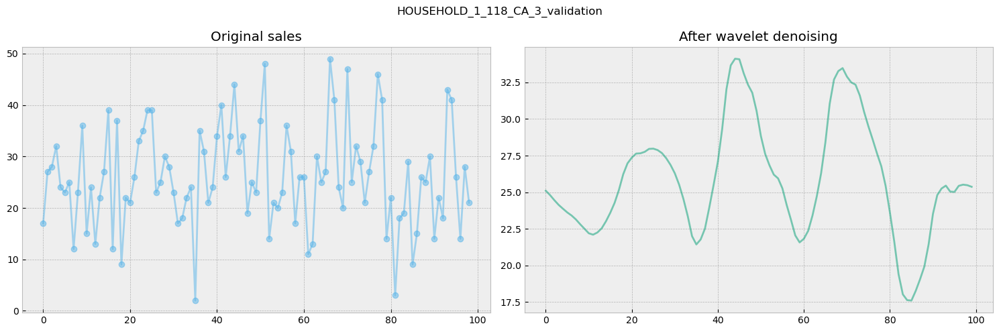

In [16]:
fig, axs = plt.subplots(len(graph_ids), 2, figsize=(30,10)) 
axs = axs.flatten() 

ax_id = 0
for graph_id in graph_ids:
    examples[graph_id][ids[graph_id]][:99].plot(figsize=(15,5),color=next(color_cycle), marker='o', alpha=0.5,
                                                title='Original sales', ax=axs[ax_id])
    ax_id+=1
    pd.Series(denoise(examples[graph_id][ids[graph_id]][:99])).plot(figsize=(15,5),color=next(color_cycle), alpha=0.5,
                                                                     title='After wavelet denoising', ax=axs[ax_id])
    ax_id+=1
    plt.suptitle(f'{ids[graph_id]}')
    
plt.tight_layout()
plt.show()

4.2 **Average smoothing or rolling mean denoising** - A method that uses window & stride concept to denoise the data by taking mean of windowed elements and moving the window by stride.

In [17]:
def average_smoothing(x, window=3, stride=1):
    new_x = []
    start = 0
    end = window
    while end <= len(x):
        new_x.extend(np.ones(end-start) * np.mean(x[start:end]))
        start = start + stride
        end = end + stride
    return np.array(new_x)

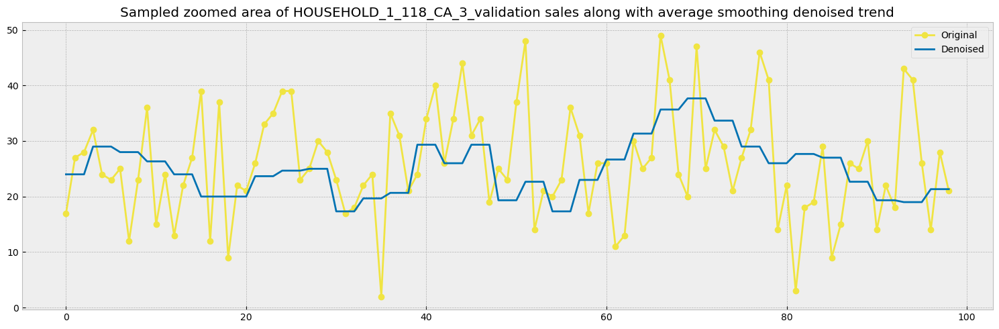

In [18]:
fig, axs = plt.subplots(len(graph_ids), 1, figsize=(15,10)) 
if len(graph_ids) != 1 : axs=axs.flatten() 

ax_id = 0
for graph_id in graph_ids:
    examples[graph_id][ids[graph_id]][:99].plot(figsize=(15,5),color=next(color_cycle), marker='o', label='Original',
                                                title=f'Sampled zoomed area of {ids[graph_id]} sales along with average smoothing denoised trend', ax=axs[ax_id] if len(graph_ids)!=1 else axs)
    pd.Series(average_smoothing(examples[graph_id][ids[graph_id]])[:99]).plot(figsize=(15,5),color=next(color_cycle), label='Denoised',
                                                ax=axs[ax_id] if len(graph_ids)!=1 else axs)
    axs[ax_id].legend() if len(graph_ids)!=1 else axs.legend()
    ax_id+=1
    
plt.tight_layout()
plt.show()


Plot original sales and denoised sales side-by-side for better understanding the trend.

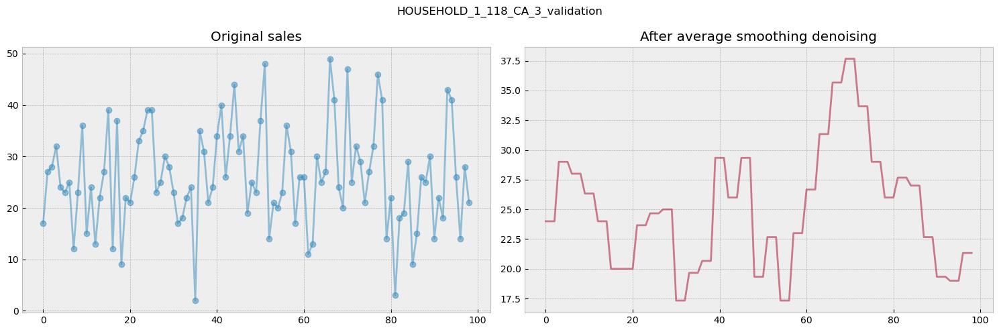

In [19]:
fig, axs = plt.subplots(len(graph_ids), 2, figsize=(30,10)) 
axs = axs.flatten() 

ax_id = 0
for graph_id in graph_ids:
    examples[graph_id][ids[graph_id]][:99].plot(figsize=(15,5),color=next(color_cycle), marker='o', alpha=0.5,
                                                title='Original sales', ax=axs[ax_id])
    ax_id+=1
    pd.Series(average_smoothing(examples[graph_id][ids[graph_id]])[:99]).plot(figsize=(15,5),color=next(color_cycle), alpha=0.5,
                                                                     title='After average smoothing denoising', ax=axs[ax_id])
    ax_id+=1
    plt.suptitle(f'{ids[graph_id]}')
    
plt.tight_layout()
plt.show()

### Sales broken down by day of the week, month and year

/var/folders/8l/bxp0rg6s0250bdtld8bb_z840000gn/T/ipykernel_25068/3934242112.py:5: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  examples[i].groupby('wday').mean()[ids[i]] \
/var/folders/8l/bxp0rg6s0250bdtld8bb_z840000gn/T/ipykernel_25068/3934242112.py:8: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  examples[i].groupby('month').mean()[ids[i]] \
/var/folders/8l/bxp0rg6s0250bdtld8bb_z840000gn/T/ipykernel_25068/3934242112.py:11: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select 

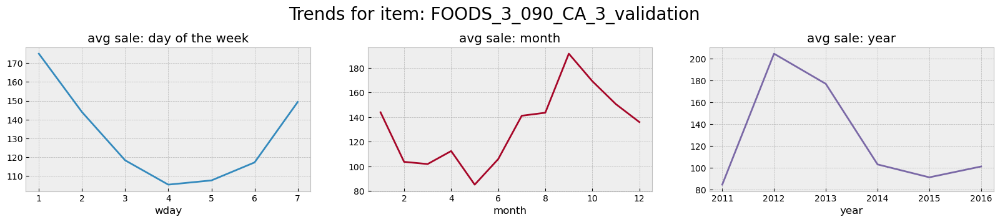

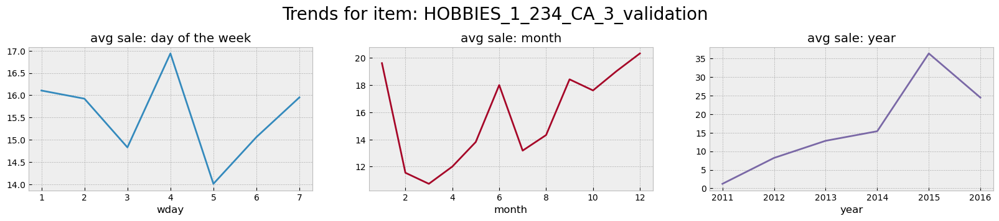

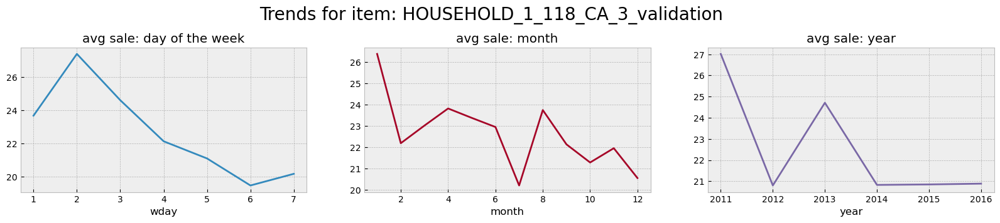

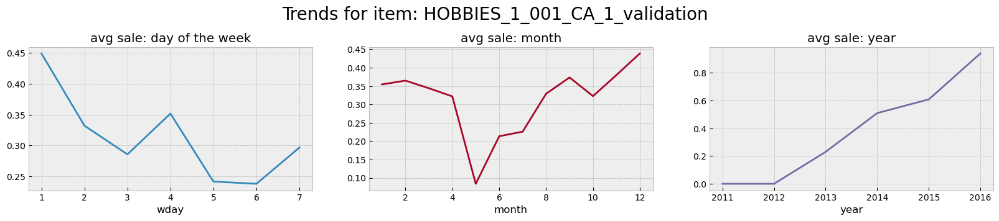

In [20]:
graph_ids = list(range(len(ids)))
for i in range(len(graph_ids)):
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 3))
    # Groupby 'wday' column, do mean/count to values of other columns, extract the specific sales Id column
    examples[i].groupby('wday').mean()[ids[i]] \
    .plot(kind='line', title='avg sale: day of the week', color=color_pal[0], ax=ax1)
    
    examples[i].groupby('month').mean()[ids[i]] \
    .plot(kind='line', title='avg sale: month', color=color_pal[1], ax=ax2)
    
    examples[i].groupby('year').mean()[ids[i]] \
    .plot(kind='line', title='avg sale: year', color=color_pal[2], ax=ax3)
    
    fig.suptitle(f'Trends for item: {ids[i]}', size=20, y=1.1)

### Visualizing random 20 different items with their sales to analyze some trends

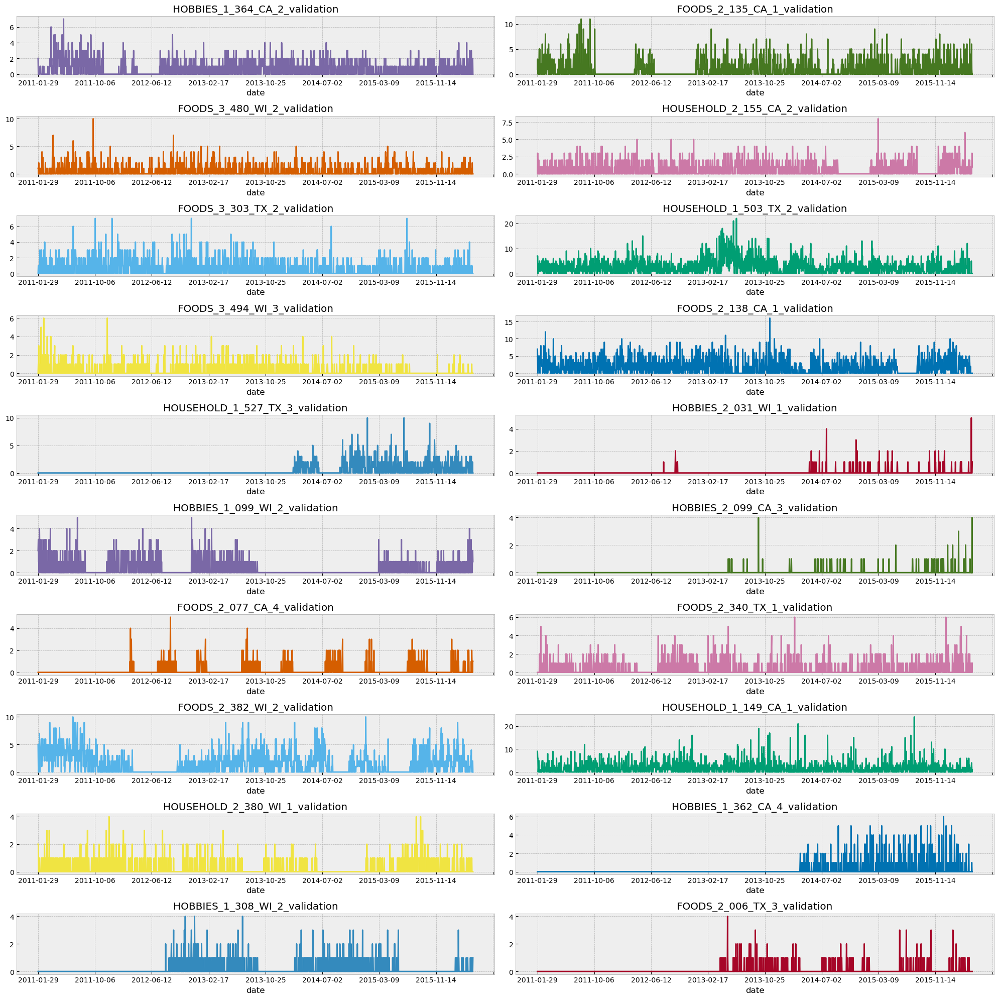

In [21]:
twenty_examples = stv_data.sample(20, random_state=666) # Sample random 20 samples from the stv dataframe
list_of_sampled_id = list(twenty_examples['id']) # Extract the list of sampled id of items so as to just keep these id values in the dataframe eventually
twenty_examples = twenty_examples.set_index('id')[d_idx].T # Set the index of dataframe to be id column, select only the d columns & transform the 
twenty_examples = twenty_examples.reset_index().rename(columns={'index':'d'})
twenty_examples = twenty_examples.merge(cal_data)
twenty_examples = twenty_examples.set_index('date')[list_of_sampled_id] 


fig, axs = plt.subplots(10, 2, figsize=(20,20))
axs = axs.flatten()

axs_id = 0
for item in twenty_examples.columns:
    twenty_examples[item].plot(title=item, color=next(color_cycle), ax=axs[axs_id])
    axs_id += 1
plt.tight_layout()
plt.show()

Some observations:
- Some items are unavailable for a period of time.
- Some items only sell 1 or less in a day, making it very hard to predict.
- Other items show spikes in their demand, possibly the "events" provided to us could help with these.

### Combine sales over time by category type

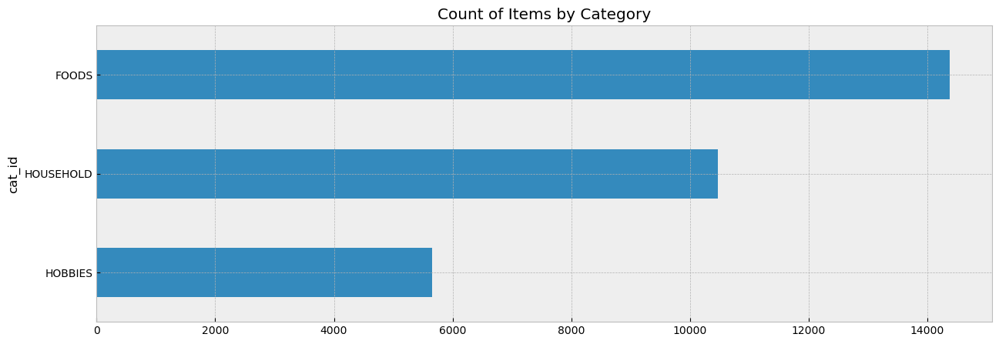

In [22]:
# Plot count of items by category
stv_data.groupby('cat_id').count()['id'].sort_values().plot(kind='barh', title='Count of Items by Category', figsize=(15, 5))
plt.show()

We have several item types:
- Hobbies
- Household
- Foods

Plot the total sales over time for each type.

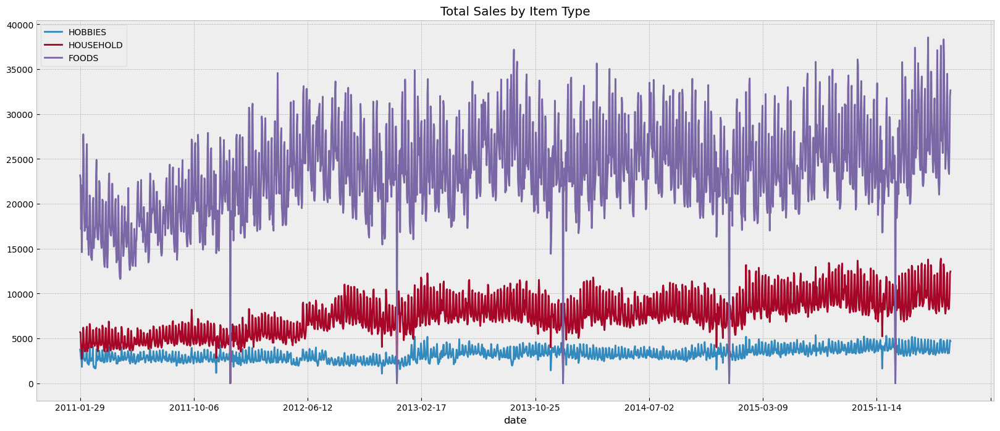

In [23]:
past_sales_item = stv_data.set_index('id')[d_idx].T \
.merge(cal_data.set_index('d')['date'], left_index=True, right_index=True).set_index('date')

for i in stv_data['cat_id'].unique():
    items_col = [c for c in past_sales_item.columns if i in c]
    past_sales_item[items_col].sum(axis=1).plot(figsize=(20,8), title='Total Sales by Item Type')

plt.legend(stv_data['cat_id'].unique())
plt.show()

#### Rollout of items being sold

Some items come into supply that previously didn't exist. Similarly, some items stop being sold completely. 
So plot the sales, but only count if item is selling or not selling.

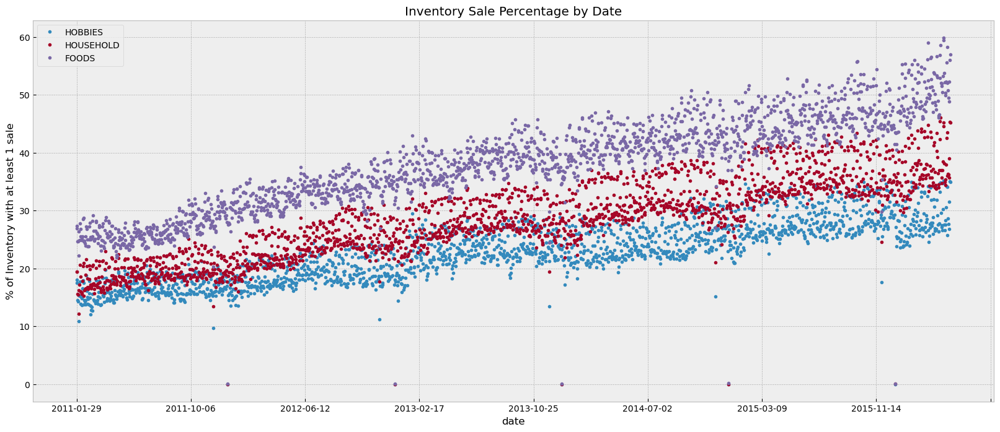

In [24]:
past_sales_clipped = past_sales_item.clip(0, 1) # Give the value of 0 or 1 to rows with no value or some value respectively, trim values to input thresholds

for i in stv_data['cat_id'].unique():
    items_col = [c for c in past_sales_clipped.columns if i in c]
    (past_sales_clipped[items_col].mean(axis=1)*100).plot(figsize=(20,8), style='.', title='Inventory Sale Percentage by Date')
plt.ylabel('% of Inventory with at least 1 sale')
plt.legend(stv_data['cat_id'].unique())
plt.show()


This plot shows that many items are being slowly introduced into inventory, so many of them will not register a sale at the beginning of the provided data.

### Sales by stores

The provided data contains 10 unique stores.

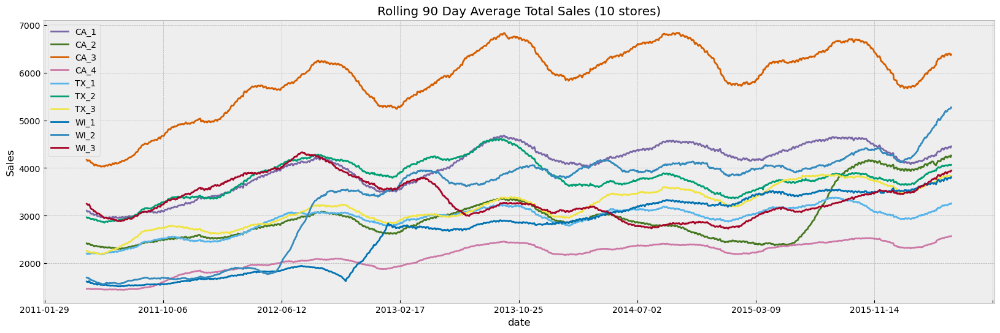

In [26]:
store_list = price_data['store_id'].unique()
for i in store_list:
    # Rolling 90 day average of sales 
    store_items = [c for c in past_sales_item.columns if i in c]
    past_sales_item[store_items].sum(axis=1).rolling(90).mean() \
    .plot(kind='line', figsize=(20,6), color=next(color_cycle), title='Rolling 90 Day Average Total Sales (10 stores)')

plt.ylabel('Sales')
plt.legend(store_list)
plt.show()

Some observations:
- Some stores are more steady than others.

- CA_2 seems to have a big change occur in 2015. WI_2 seems to have a big chance in 2012.

#### Rolling 90 day whisker plot/box plot for average sales and store by matplolib

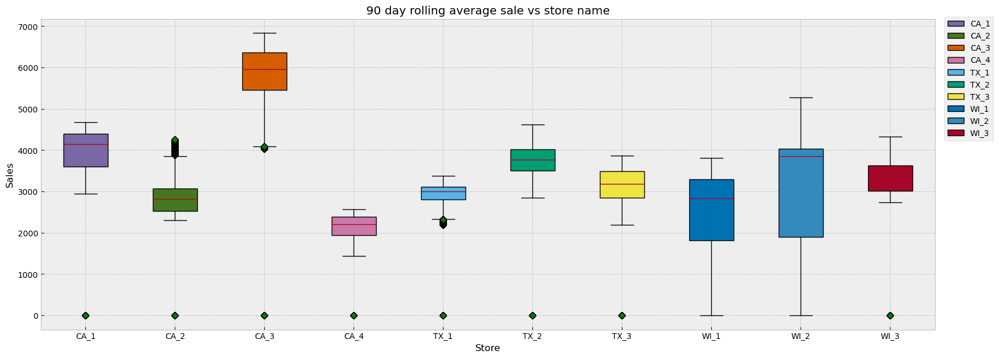

In [27]:
all_data = []

for s in store_list:
    store_items = [c for c in past_sales_item.columns if s in c]
    data = past_sales_item[store_items].sum(axis=1).rolling(90).mean()
    all_data.append(np.nan_to_num(np.array(data)))


plt.figure(figsize=(20,7)) 
green_diamond = dict(markerfacecolor='g', marker='D')
bplot = plt.boxplot(all_data, labels=store_list, flierprops=green_diamond, patch_artist=True, manage_ticks=True)

# fill boxplots with colors
colors = [next(color_cycle) for i in range(0,len(store_list))]
for patch, color in zip(bplot['boxes'], colors):
    patch.set_facecolor(color)   

plt.xlabel('Store')
plt.ylabel('Sales')
plt.title('90 day rolling average sale vs store name')
plt.legend(bplot['boxes'],store_list, bbox_to_anchor=(1.07, 1.02))
plt.show()

#### Mean store sales 

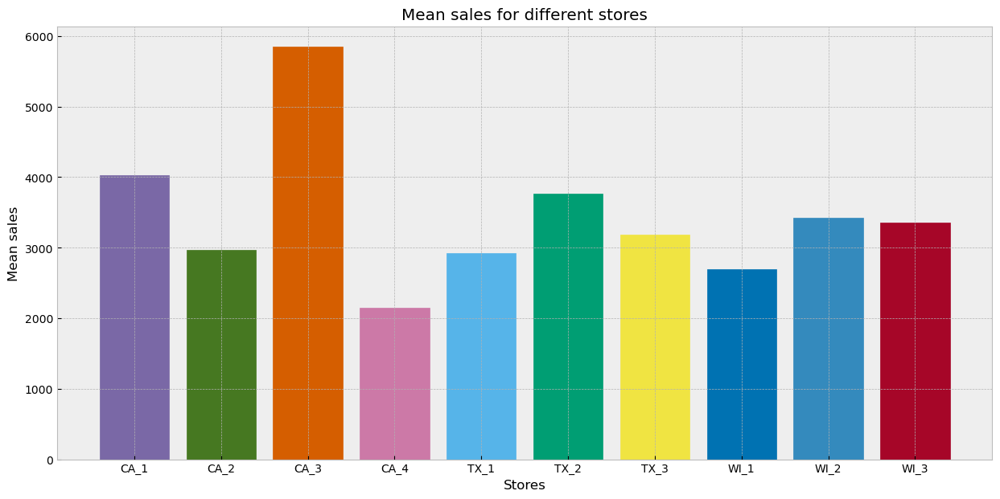

In [28]:
mean_value_store = []
for s in store_list:
    store_items = [c for c in past_sales_item if s in c]
    mean_value_store.append(np.mean(past_sales_item[store_items].sum(axis=1)))

plt.figure(figsize=(15,7))
bplot = plt.bar(store_list,mean_value_store)

# fill different colors for bar plot
colors = [next(color_cycle) for i in range(0,len(store_list))]
for i, b in enumerate(bplot):
    b.set_color(colors[i])
    
plt.xlabel('Stores')
plt.ylabel('Mean sales')
plt.title('Mean sales for different stores')
plt.show()


### Rolling 7 day sales count by stores

We can plot a rolling 7 day total demand count by store. Note clearly that some stores have abrupt changes in their demand, it could be that the store expanded or a new competitor was built near by. Either way this is imporant to note when creating predictive models about demand pattern.

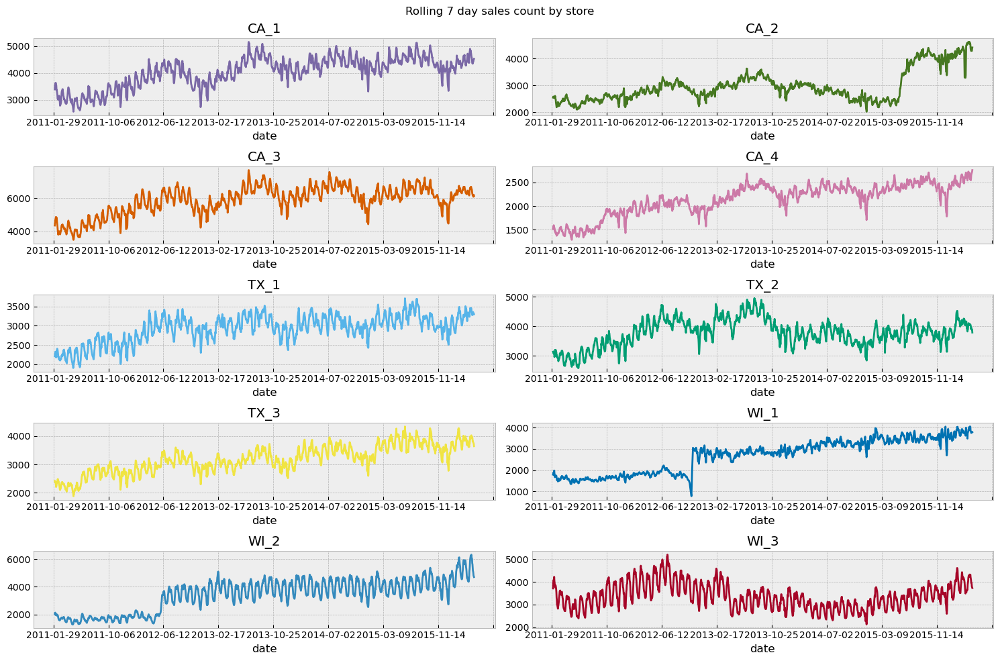

In [29]:
fig, axs = plt.subplots(5, 2, figsize=(15,10))
axs = axs.flatten()
ax_id = 0

for i in price_data['store_id'].unique():
    store_items = [c for c in past_sales_item.columns if i in c]
    past_sales_item[store_items].sum(axis=1) \
    .rolling(7).mean() \
    .plot(title=i, color=next(color_cycle), ax=axs[ax_id])   
    ax_id+=1

plt.suptitle('Rolling 7 day sales count by store')
plt.tight_layout()
plt.show()

In [30]:
# Plot daily sales count in a week by stores 
stv_data.groupby('store_id').sum().T \
.merge(cal_data.set_index('d'), left_index=True, right_index=True).set_index('date').groupby('wday').mean()[price_data['store_id'].unique()] 

/var/folders/8l/bxp0rg6s0250bdtld8bb_z840000gn/T/ipykernel_25068/1154310972.py:2: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  stv_data.groupby('store_id').sum().T \
/var/folders/8l/bxp0rg6s0250bdtld8bb_z840000gn/T/ipykernel_25068/1154310972.py:2: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  stv_data.groupby('store_id').sum().T \


,CA_1,CA_2,CA_3,CA_4,TX_1,TX_2,TX_3,WI_1,WI_2,WI_3
wday,,,,,,,,,,
1,5064.722628,3981.040146,6722.861314,2395.810219,3451.700730,4505.357664,3678.284672,3642.175182,3974.427007,4130.514599
2,5129.744526,3808.335766,7039.007299,2460.916058,3661.901460,4624.875912,3780.302920,3137.113139,3613.996350,3873.828467
3,3853.578755,2620.098901,5882.446886,2176.714286,2806.963370,3657.630037,3184.633700,2308.813187,3230.150183,3131.937729
4,3410.919414,2449.021978,5379.721612,1999.073260,2584.556777,3279.161172,2874.747253,2244.626374,3159.260073,2987.692308
5,3320.036630,2445.769231,5196.124542,1940.783883,2575.417582,3284.457875,2818.809524,2310.318681,3200.369963,2917.934066
6,3359.666667,2507.120879,5138.490842,1947.967033,2584.772894,3333.161172,2830.736264,2331.842491,3205.183150,2966.065934
7,4022.582418,2985.996337,5573.282051,2092.725275,2804.205128,3708.227106,3110.402930,2861.311355,3559.556777,3507.695971


In [31]:
print('The lowest sale date was:', past_sales_item.sum(axis=1).sort_values().index[0],
     'with', past_sales_item.sum(axis=1).sort_values().values[0], 'sales')
print('The lowest sale date was:', past_sales_item.sum(axis=1).sort_values(ascending=False).index[0],
     'with', past_sales_item.sum(axis=1).sort_values(ascending=False).values[0], 'sales')

The lowest sale date was: 2012-12-25 with 11 sales
The lowest sale date was: 2016-03-06 with 57218 sales


It appears that walmarts are closed on Chirstmas day. The highest demand day of all the data was on Sunday March 6th, 2016. 

### Sale prices

1. Sale price of one of the most selling product over the years along different stores.

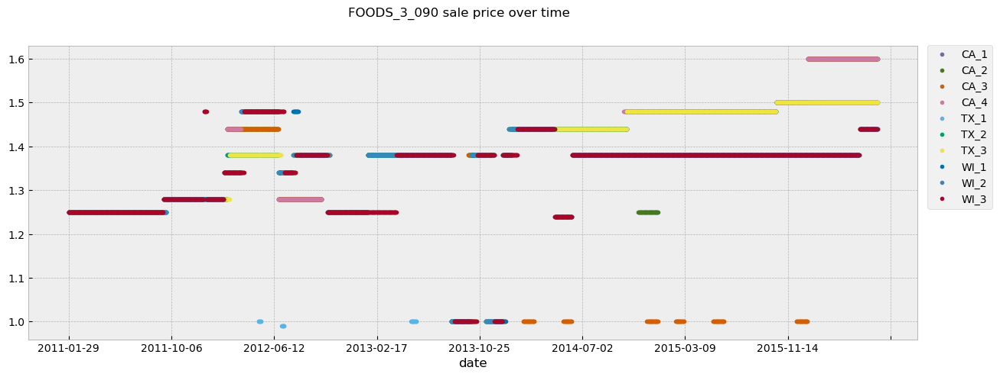

In [32]:
fig, axs = plt.subplots(figsize=(15,5))
stores = []

for store, d in price_data.query('item_id == "FOODS_3_090"').groupby('store_id'):
    # Merge cal_data with wm_yr_wk to plot against actual dates
    merged_d = d.set_index('wm_yr_wk').merge(cal_data.set_index('wm_yr_wk'),left_index=True, right_index=True)
    # Plot the sales over time 
    merged_d.plot(x='date', y='sell_price', color=next(color_cycle), ax=axs, legend=store, style='.')
    stores.append(store)

plt.legend(stores, bbox_to_anchor=(1.09,1.02))
plt.suptitle('FOODS_3_090 sale price over time')
plt.show()

Some observations:
- The price of this item is growing.
- Different stores have different selling prices for the same price.

2. Log distribution of sale price for different item types.

In [33]:
# Add a category column to price_data 
price_data['Category'] = price_data['item_id'].apply(lambda x: x.split('_')[0])

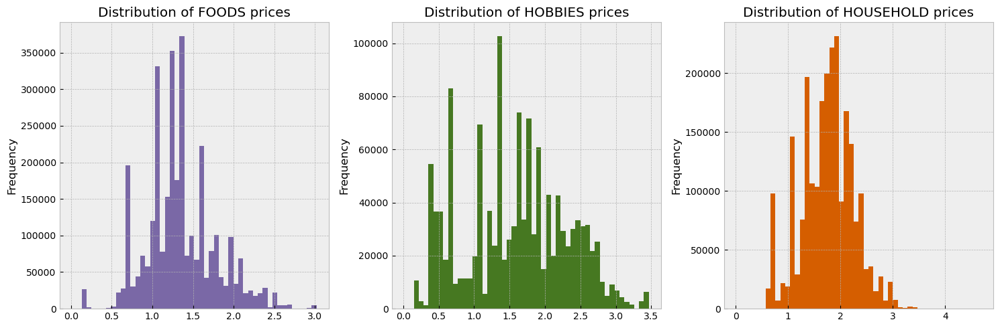

In [34]:
fig, axs = plt.subplots(1, 3, figsize=(15,5))
ax_id = 0

for cat, d in price_data.groupby('Category'):
    # Do the log of values of sell_price columns & plot it's histogram distribution
    d['sell_price'].apply(np.log1p).plot(kind='hist', bins=50,ax=axs[ax_id], color=next(color_cycle), title=f"Distribution of {cat} prices")
    ax_id+=1
        
plt.tight_layout()
plt.show()

## <span style='color:blue'>*Section II Baisc Statistical Time-Series Models*</span>

**This section contains various statistical time-series models implementation: Naive, Moving Average, Holt Exponential Smoothing, Winter Exponential Smoothing, ARIMA & Prophet.**

In [35]:
train_data = stv_data[d_idx[-100:-30]]
val_data = stv_data[d_idx[-30:]]

print(val_data, val_data.shape, train_data.shape)

       d_1884  d_1885  d_1886  d_1887  d_1888  d_1889  d_1890  d_1891  d_1892  \
0           1       1       1       0       0       0       0       0       1   
1           1       1       1       0       0       0       0       0       0   
2           1       0       0       0       0       0       0       0       1   
3           6       6       0       0       0       0       3       1       2   
4           0       0       1       0       4       4       0       1       4   
...       ...     ...     ...     ...     ...     ...     ...     ...     ...   
30485       0       0       0       0       0       0       0       0       0   
30486       0       0       0       0       0       0       0       1       1   
30487       0       1       1       0       0       0       0       1       1   
30488       2       4       3       0       0       0       0       0       1   
30489       0       5       7       3       1       4       3       3       1   

       d_1893  ...  d_1904 

In [36]:
# Utility function to plot graph
def plot_graphs(ids=[0, 2], pred=[], pred_value=False):
    fig, axs = plt.subplots(len(ids), 1, figsize=(20,5))
    if len(ids)!=1 : axs = axs.flatten()
    
    if len(ids)==1:
        axs.plot(list(train_data.loc[ids[0]].keys()), train_data.loc[ids[0]].values)
        axs.plot(list(val_data.loc[ids[0]].keys()), val_data.loc[ids[0]].values)
        if pred_value and pred.any():
            axs.plot(list(val_data.loc[ids[0]].keys()), pred[ids[0]])
        axs.tick_params(axis='x', rotation=90)
    else:
        ax_id=0
        for i in ids:
            axs[ax_id].plot(list(train_data.loc[i].keys()), train_data.loc[i].values)
            axs[ax_id].plot(list(val_data.loc[i].keys()), val_data.loc[i].values)
            if pred_value and pred.any():
                axs[ax_id].plot(list(val_data.loc[i].keys()), pred[i])
            axs[ax_id].tick_params(axis='x', rotation=90)
            ax_id+=1
    plt.suptitle('Plot of few items with train and validation data respectively')
    plt.tight_layout()
    plt.show()   

Plot the train & validation data to compare further model predictions.

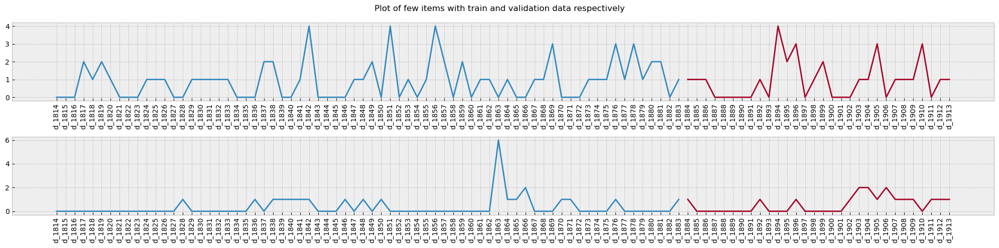

In [37]:
ids = [0, 2]
plot_graphs(ids, [], False)

<span style='color:maroon'>1. **Naive Approach** </span>
- Forecast the next day sales as current day sales

In [38]:
def naive_approach():
    predictions=[]
    for i in range(len(val_data.columns)):
        if i==0:
            predictions.append(train_data[train_data.columns[-1]].values)
        else:
            predictions.append(val_data[val_data.columns[i-1]].values)
    predictions = np.transpose(np.array([list(row) for row in predictions]))
    error_norm = np.linalg.norm(predictions[:3] - val_data[:3] / len(predictions[0]))
    return predictions, float(error_norm)

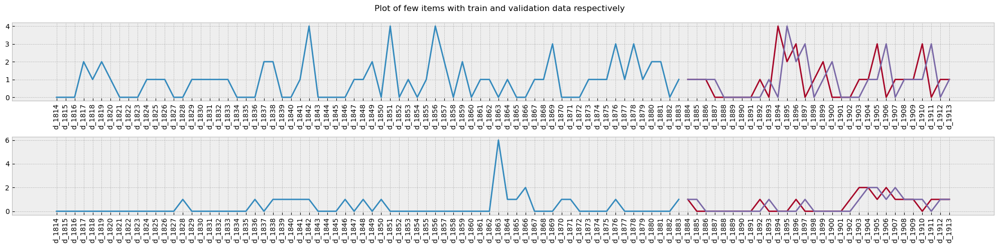

In [39]:
ids = [0, 2]
pred, error_naive = naive_approach()
plot_graphs(ids, pred, True)

<span style='color:maroon'>2. **Moving average** </span>
- Take past days (like 30) into consideration to predict the future values

In [40]:
def moving_average(window=30):
    predictions = []
    for i in range(0, len(val_data.columns)):
        if i == 0:
            predictions.append(np.mean(train_data[train_data.columns[-window:]].values, axis=1))
        if i > 0 and i <= window:
            predictions.append(np.mean(train_data[train_data.columns[-window+i:]].values, axis=1) + np.mean(val_data[val_data.columns[:i]].values, axis=1))
        if i > window + 1:
            predictions.append(np.mean(val_dataset[val_data.columns[:i]].values, axis=1))
    predictions = np.transpose(np.array([list(row) for row in predictions]))
    error_norm = np.linalg.norm(predictions[:3] - val_data[:3] / len(predictions[0]))
    return predictions, float(error_norm)

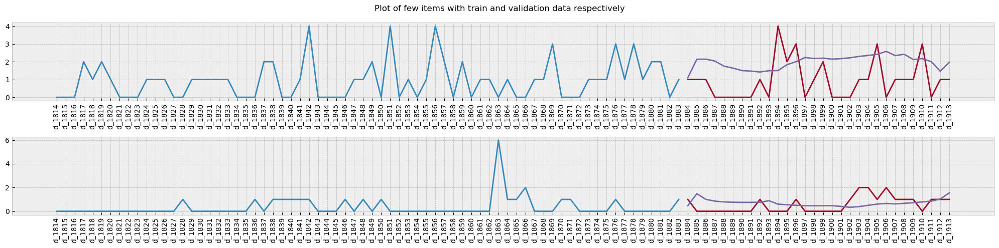

In [41]:
ids = [0, 2]
pred, error_moving = moving_average()
plot_graphs(ids, pred, True)

<span style='color:maroon'> 3. **Holt Exponential Smoothing** </span>
- Holt Exponential smoothing with trend but no seasonality 
- https://www.youtube.com/watch?v=DUyZl-abnNM

In [42]:
def holt_smoothing():
    predictions = []
    for row in tqdm(train_data[train_data.columns[-30:]].values[:3]):
        fit = Holt(row).fit(smoothing_level=0.3, smoothing_trend=0.01)
        predictions.append(fit.forecast(30))
    predictions = np.array(predictions).reshape(-1,30)
    error_norm = np.linalg.norm(predictions[:3] - val_data[:3] / len(predictions[0]))
    return predictions, float(error_norm)

  0%|          | 0/3 [00:00<?, ?it/s]

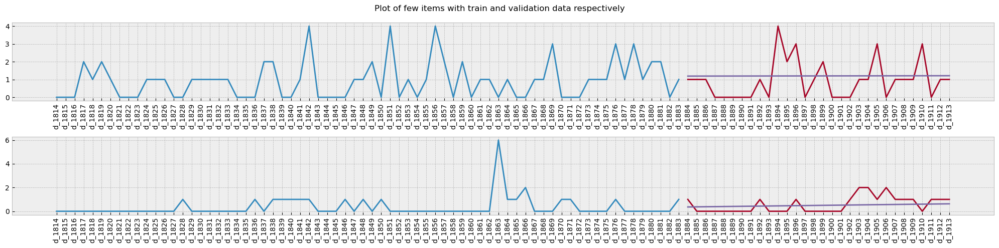

In [43]:
ids = [0, 2]
pred, error_holt = holt_smoothing()
plot_graphs(ids, pred, True)

<span style='color:maroon'>4. **Winter Exponential Smoothing** </span>
- Take both trend and seasonality into consideration 
- https://www.youtube.com/watch?v=mrLiC1biciY

In [44]:
def winter_smoothing():
    predictions = []
    for row in tqdm(train_data[train_data.columns[-30:]].values[:3]):
        fit = ExponentialSmoothing(row, seasonal_periods=3).fit()
        predictions.append(fit.forecast(30))
    predictions = np.array(predictions).reshape(-1, 30) # Reshaping to make sure it has 30 columns
    error_norm = np.linalg.norm(predictions[:3] - val_data[:3] / len(predictions[0]))
    return predictions, float(error_norm)

  0%|          | 0/3 [00:00<?, ?it/s]

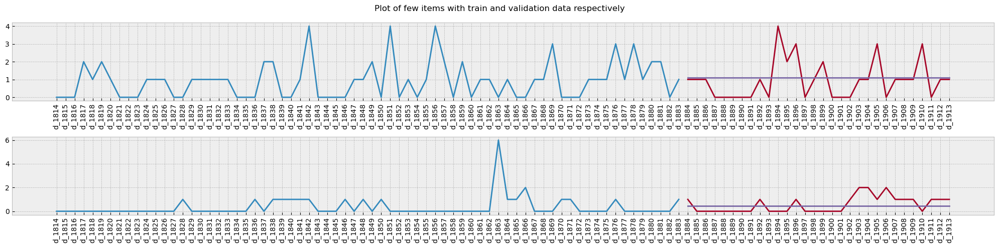

In [45]:
ids = [0, 2]
pred, error_winter = winter_smoothing()
plot_graphs(ids, pred, True)

<span style='color:maroon'>5. **ARIMA Model (Auto Regressive Integrated Moving Average)** </span>
- Aim to describe correlations in time series 
- https://www.youtube.com/watch?v=2XGSIlgUBDI

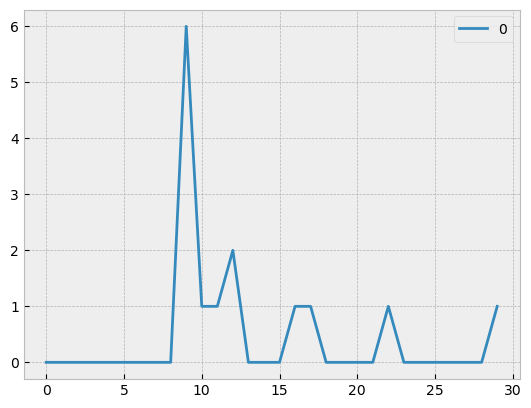

In [46]:
df = pd.DataFrame(train_data[train_data.columns[-30:]].values[2:3][0])
df.plot();

In [47]:
# Test for stationarity using dickey fuller's test
from statsmodels.tsa.stattools import adfuller

In [48]:
# H0 hypothesis: It is non stationary
# H1 hypothesis: It is stationary
# If p-value <= 0.05: reject H0 hypothesis -> stationary

def adfuller_test(val):
    result = adfuller(val)
    labels = ['ADF test statistics', 'p-value', '#Lags used', 'No of observations used']
    for value, label in zip(result, labels):
        print(label + ':' + str(value))
    if result[1] <= 0.05:
        print('Strong evidence against the null hypothesis(Ho), reject the null hypothesis. Data has no unit root and is stationary')
    else:
        print('Weak evidence against null hypothesis, time series has a unit root, indicating it is non-stationary')

In [49]:
adfuller_test(train_data[train_data.columns[-30:]].values[2:3][0])

ADF test statistics:-2.3516987258045954
p-value:0.15583549661055118
#Lags used:2
No of observations used:27
Weak evidence against null hypothesis, time series has a unit root, indicating it is non-stationary


ADF test statistics:-1.2367414008368363
p-value:0.6575942439327376
#Lags used:9
No of observations used:13
Weak evidence against null hypothesis, time series has a unit root, indicating it is non-stationary


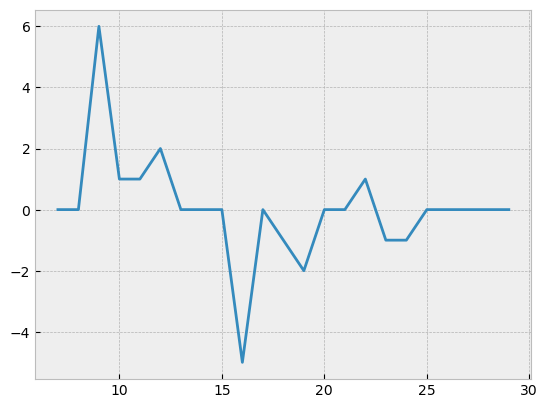

In [50]:
# Differencing to make it stationary
example = (train_data[train_data.columns[-30:]].loc[2]).reset_index()
example.columns = ['index', 'sales']

# Number by which the seasonality is present, if the seasonal cycle is 1 cycle in 12 months then, we pass 12 
example['seasonal first difference'] = example['sales'] - example['sales'].shift(7) # it is 7; shift 7 steps downward

adfuller_test(example['seasonal first difference'].dropna())
example['seasonal first difference'].plot()
plt.show()

Auto-correlation and partial auto-correlation to determine the lags as in how many previous days data I need to consider to make good predictions.

p,d,q:
- p for AR model lags
- d for differencing
- q for MA lags

AR (Auto Regression) model lags are best estimated with PACF, and MA (Moving Average) model is best done with ACF.

In [51]:
import statsmodels.api as sm
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

/Users/ivy/opt/miniconda3/envs/ml_mac/lib/python3.8/site-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


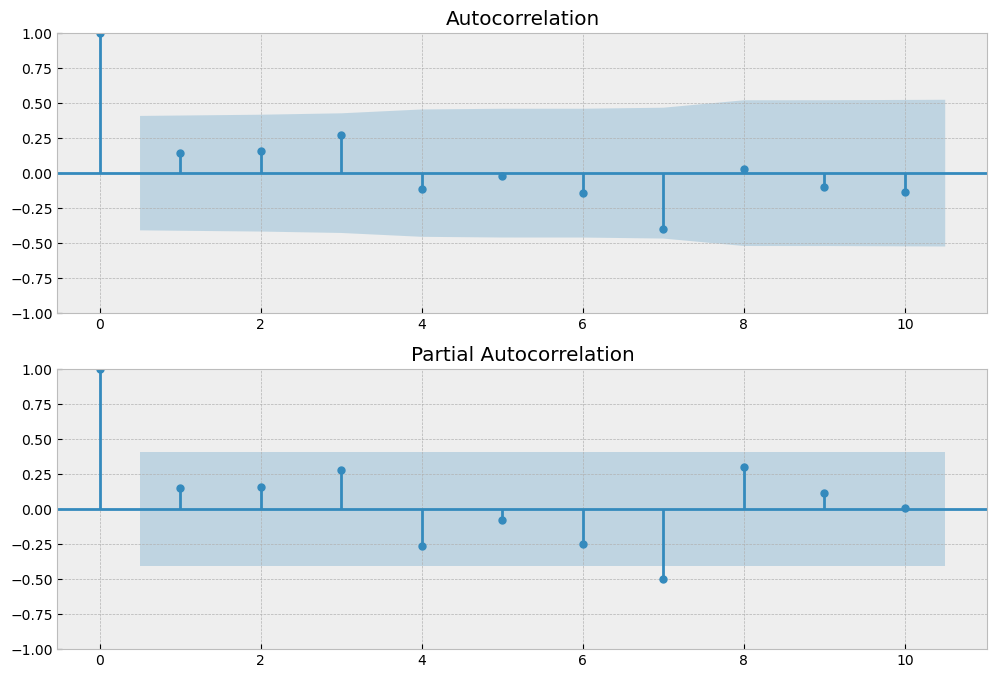

In [52]:
fig = plt.figure(figsize=(12,8))
ax1 = fig.add_subplot(211)
fig = sm.graphics.tsa.plot_acf(example['seasonal first difference'].dropna(), lags=10, ax=ax1)
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(example['seasonal first difference'].dropna(), lags=10, ax=ax2)

In [53]:
(train_data[train_data.columns[-1:]].d_1883.values)

array([1, 1, 1, ..., 2, 1, 2])

In [54]:
def arima():
    predictions = []
    for row in tqdm(train_data[train_data.columns[-30:]].values[:3]):
        fit = sm.tsa.statespace.SARIMAX(row, seasonal_order=(0,1,1,7)).fit() # seasonal ARIMA
        predictions.append(fit.forecast(30))
        print(fit.aic)
    predictions = np.array(predictions).reshape(-1, 30)
    error_norm = np.linalg.norm(predictions[:3] - val_data[:3] / len(predictions[0]))
    return predictions, float(error_norm)

  0%|          | 0/3 [00:00<?, ?it/s]

/Users/ivy/opt/miniconda3/envs/ml_mac/lib/python3.8/site-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.33880D+00    |proj g|=  5.86242D-02

At iterate    5    f=  1.31653D+00    |proj g|=  6.96383D-03

At iterate   10    f=  1.31623D+00    |proj g|=  4.91473D-03

At iterate   15    f=  1.31618D+00    |proj g|=  2.06596D-03

At iterate   20    f=  1.31617D+00    |proj g|=  4.88389D-04

At iterate   25    f=  1.31617D+00    |proj g|=  5.61462D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     27     33      1     0     0   

 This problem is unconstrained.



At iterate   10    f=  1.36245D+00    |proj g|=  1.30575D-03

At iterate   15    f=  1.36214D+00    |proj g|=  5.68352D-04

At iterate   20    f=  1.36212D+00    |proj g|=  3.04596D-04

At iterate   25    f=  1.36212D+00    |proj g|=  7.78907D-04

At iterate   30    f=  1.36212D+00    |proj g|=  1.17958D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     32     52      1     0     0   4.145D-06   1.362D+00
  F =   1.3621179718029497     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
87.72707830817698


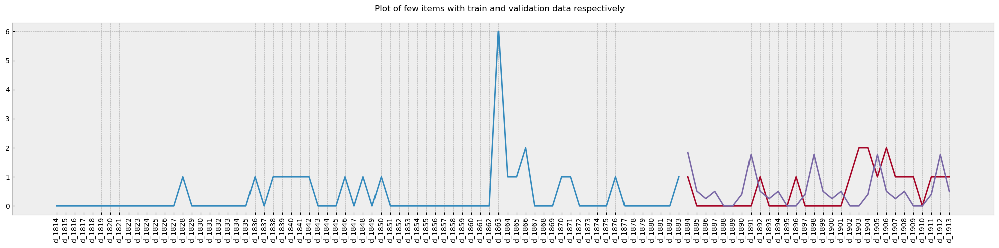

In [55]:
ids = [2]
pred, error_arima = arima()
plot_graphs(ids, pred, True)

<span style='color:maroon'>6. **Facebook Prophet** </span>
- Additive model where non-linear trends are fit with yearly, weekly, and daily seasonality, including holiday effects
- https://www.youtube.com/watch?v=95-HMzxsghY

In [59]:
def prophet():
    predictions = []
    forecasts = []
    models = []
    dates = ["2007-12-" + str(i) for i in range(1, 31)]
    for row in tqdm(train_data[train_data.columns[-30:]].values[:3]):
        df = pd.DataFrame(np.transpose([dates, row]))
        df.columns = ['ds', 'y']
        model = Prophet(daily_seasonality=True)
        model.fit(df)
        future = model.make_future_dataframe(periods=30)
        forecast = model.predict(future)
        forecasts.append(forecast)
        models.append(model)
        predictions.append(forecast['yhat'].loc[30:].values)
    predictions = np.array(predictions).reshape(-1,30)
    error_norm = np.linalg.norm(predictions[:3] - val_data[:3] / len(predictions[0]))
    return predictions, float(error_norm), forecasts, models

  0%|          | 0/3 [00:00<?, ?it/s]

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
/Users/ivy/opt/miniconda3/envs/ml_mac/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:fbprophet:n_changepoints greater than number of observations. Using 23.
/Users/ivy/opt/miniconda3/envs/ml_mac/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/ivy/opt/miniconda3/envs/ml_mac/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)



Initial log joint probability = -28.4464
Iteration  1. Log joint probability =    17.6199. Improved by 46.0663.
Iteration  2. Log joint probability =    27.5602. Improved by 9.9403.
Iteration  3. Log joint probability =    27.7191. Improved by 0.15893.
Iteration  4. Log joint probability =    28.0294. Improved by 0.31024.
Iteration  5. Log joint probability =    28.0514. Improved by 0.0219977.
Iteration  6. Log joint probability =    28.0584. Improved by 0.00697792.
Iteration  7. Log joint probability =     28.064. Improved by 0.00564507.
Iteration  8. Log joint probability =     28.066. Improved by 0.00195651.
Iteration  9. Log joint probability =    28.0666. Improved by 0.000671037.
Iteration 10. Log joint probability =    28.0678. Improved by 0.00118667.
Iteration 11. Log joint probability =    28.0684. Improved by 0.000611696.
Iteration 12. Log joint probability =    28.0685. Improved by 7.06703e-05.
Iteration 13. Log joint probability =    28.0686. Improved by 7.27821e-05.
Iterat

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
/Users/ivy/opt/miniconda3/envs/ml_mac/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:fbprophet:n_changepoints greater than number of observations. Using 23.
/Users/ivy/opt/miniconda3/envs/ml_mac/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/ivy/opt/miniconda3/envs/ml_mac/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)



Initial log joint probability = -38.0126
Iteration  1. Log joint probability =    8.00052. Improved by 46.0131.
Iteration  2. Log joint probability =    15.0116. Improved by 7.0111.
Iteration  3. Log joint probability =    15.2596. Improved by 0.24799.
Iteration  4. Log joint probability =    15.5058. Improved by 0.246176.
Iteration  5. Log joint probability =    15.5242. Improved by 0.0184053.
Iteration  6. Log joint probability =    15.5459. Improved by 0.0216882.
Iteration  7. Log joint probability =    15.5548. Improved by 0.00888363.
Iteration  8. Log joint probability =    15.5567. Improved by 0.00197873.
Iteration  9. Log joint probability =    15.5584. Improved by 0.00169628.
Iteration 10. Log joint probability =    15.5606. Improved by 0.00220613.
Iteration 11. Log joint probability =    15.5623. Improved by 0.00168581.
Iteration 12. Log joint probability =    15.5628. Improved by 0.000436209.
Iteration 13. Log joint probability =     15.563. Improved by 0.000204816.
Iteratio

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
/Users/ivy/opt/miniconda3/envs/ml_mac/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:fbprophet:n_changepoints greater than number of observations. Using 23.
/Users/ivy/opt/miniconda3/envs/ml_mac/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/ivy/opt/miniconda3/envs/ml_mac/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)



Initial log joint probability = -27.598
Iteration  1. Log joint probability =    22.7119. Improved by 50.3099.
Iteration  2. Log joint probability =     30.096. Improved by 7.38412.
Iteration  3. Log joint probability =    35.9436. Improved by 5.84767.
Iteration  4. Log joint probability =    37.3766. Improved by 1.43298.
Iteration  5. Log joint probability =    37.8158. Improved by 0.439168.
Iteration  6. Log joint probability =    38.2235. Improved by 0.407732.
Iteration  7. Log joint probability =    38.2722. Improved by 0.0486616.
Iteration  8. Log joint probability =    38.3191. Improved by 0.0469028.
Iteration  9. Log joint probability =    38.3351. Improved by 0.0160123.
Iteration 10. Log joint probability =    38.3409. Improved by 0.00577946.
Iteration 11. Log joint probability =    38.3481. Improved by 0.00722566.
Iteration 12. Log joint probability =    38.3494. Improved by 0.00128822.
Iteration 13. Log joint probability =    38.3496. Improved by 0.000161481.
Iteration 14. L

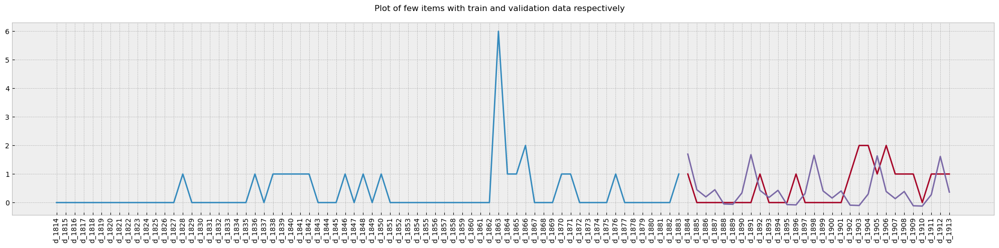

In [60]:
ids = [2]
pred, error_prophet, forecasts, models = prophet()
plot_graphs(ids, pred, True)

Plotting prophet forecast

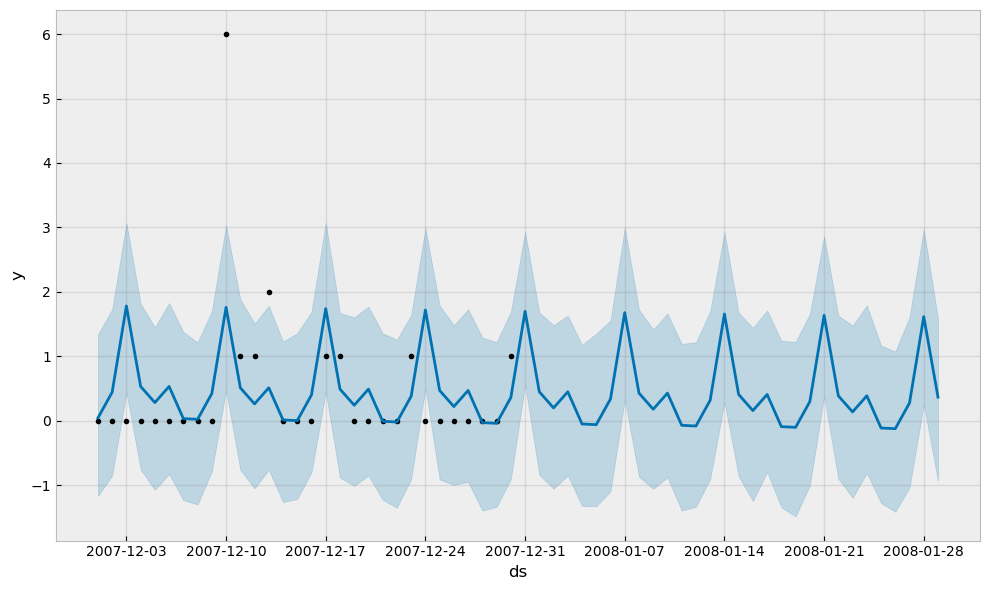

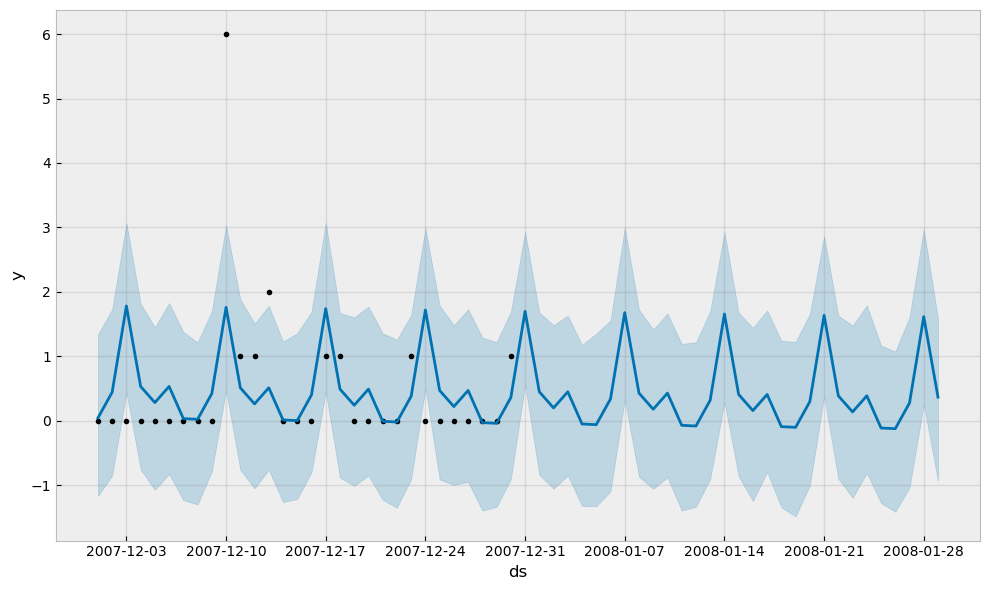

In [61]:
model2 = models[2]
forecast2 = forecasts[2]

model2.plot(forecast2)

Plotting forecast componenets

/Users/ivy/opt/miniconda3/envs/ml_mac/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/ivy/opt/miniconda3/envs/ml_mac/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


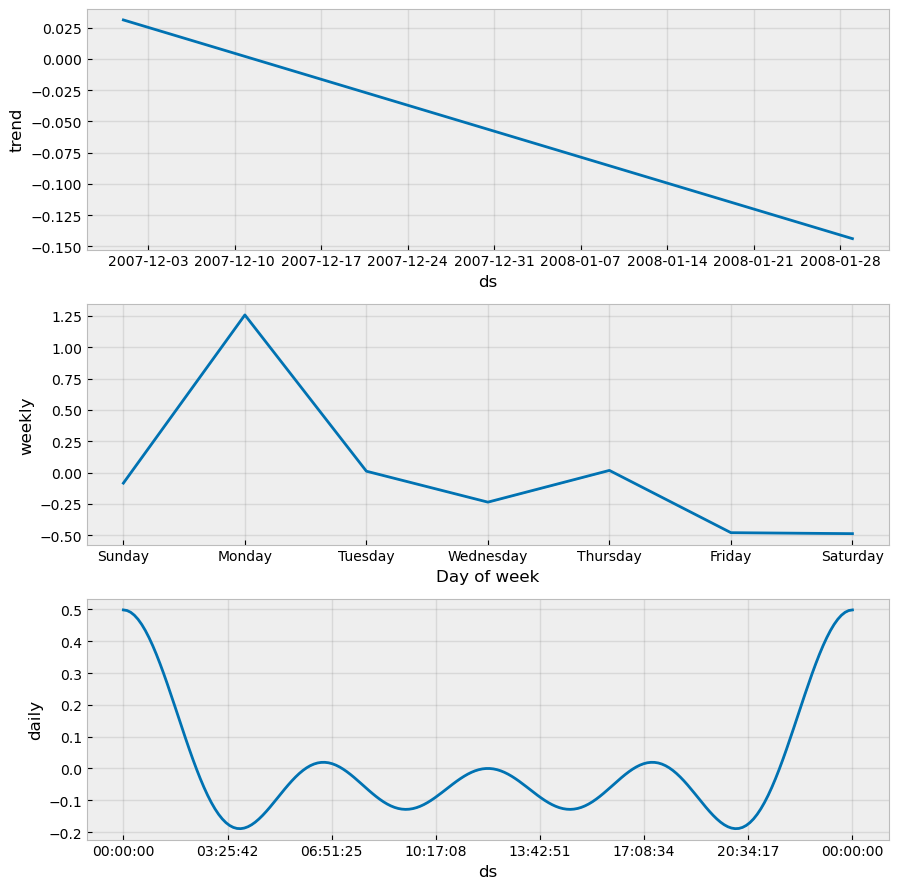

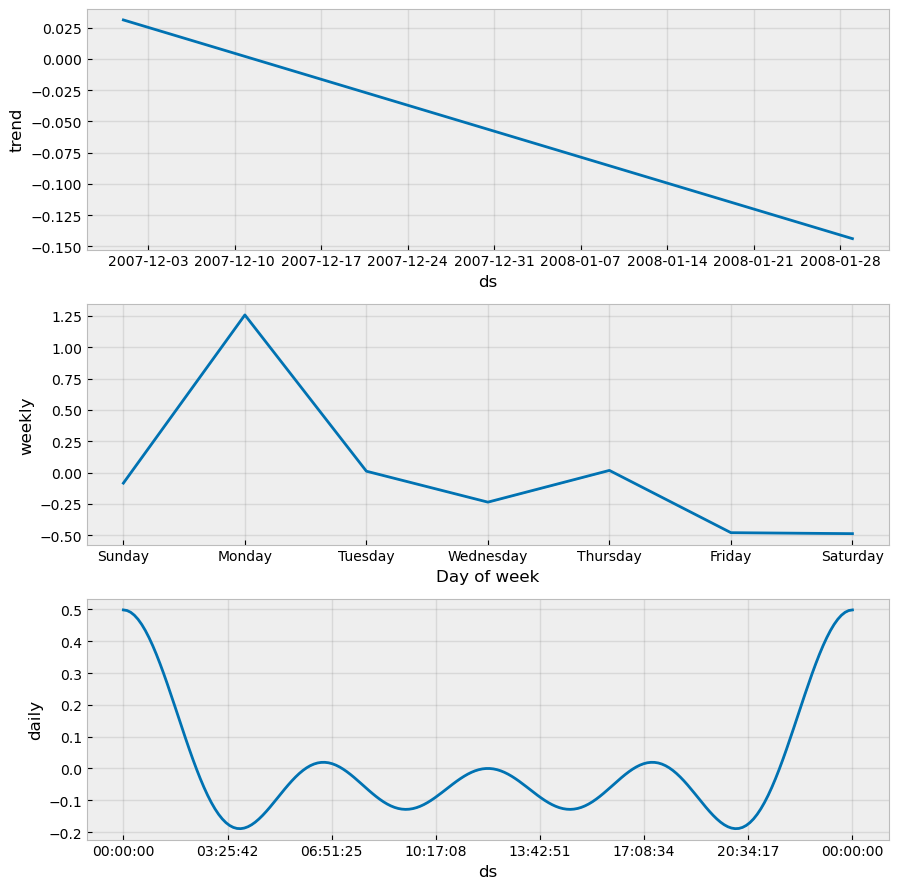

In [62]:
model2.plot_components(forecast2)

In [63]:
from fbprophet.plot import plot_plotly
import plotly.offline as py
py.init_notebook_mode()

In [64]:
fig = plot_plotly(model2, forecast2)
py.iplot(fig)

7. Error Loss of all models

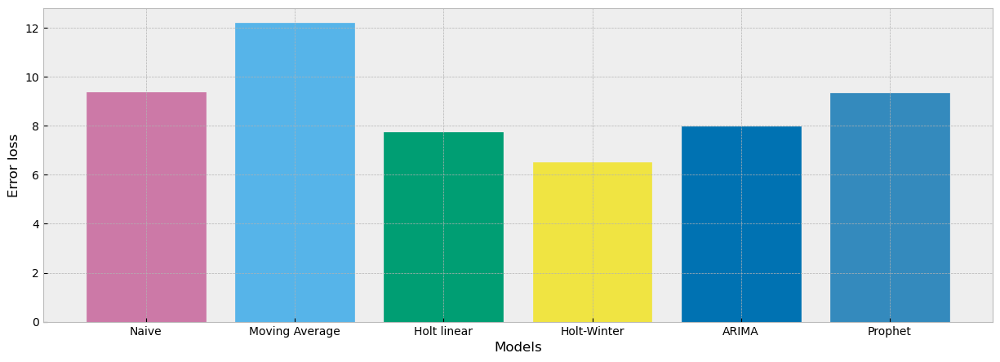

In [65]:
x_axis = ['Naive', 'Moving Average', 'Holt linear', 'Holt-Winter', 'ARIMA', 'Prophet']
y_axis = [error_naive, error_moving, error_holt, error_winter, error_arima, error_prophet]
loss_df = pd.DataFrame(np.transpose([x_axis, y_axis]))
loss_df.columns = ['model', 'error']
for i in range(6):
    loss_df['error'][i] = float(loss_df['error'][i])

plt.figure(figsize=(15,5))
bplot = plt.bar(x_axis, loss_df['error'])

#fill different colors for bar plot
colors = [next(color_cycle) for i in range(0,6)]
for i, b in enumerate(bplot):
    b.set_color(colors[i])
    
plt.xlabel('Models')
plt.ylabel('Error loss')
plt.show()

## <span style='color:maroon'> *Section III LSTM*</span>

**This section contains the implementation for RNN-LSTM to forecast time-series data.**

### View the data

In [66]:
stv_data.head()

,id,item_id,dept_id,cat_id,store_id,state_id,d_1,d_2,d_3,d_4,...,d_1904,d_1905,d_1906,d_1907,d_1908,d_1909,d_1910,d_1911,d_1912,d_1913
0,HOBBIES_1_001_CA_1_validation,HOBBIES_1_001,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,1,3,0,1,1,1,3,0,1,1
1,HOBBIES_1_002_CA_1_validation,HOBBIES_1_002,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
2,HOBBIES_1_003_CA_1_validation,HOBBIES_1_003,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,2,1,2,1,1,1,0,1,1,1
3,HOBBIES_1_004_CA_1_validation,HOBBIES_1_004,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,1,0,5,4,1,0,1,3,7,2
4,HOBBIES_1_005_CA_1_validation,HOBBIES_1_005,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,2,1,1,0,1,1,2,2,2,4


In [67]:
stv_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30490 entries, 0 to 30489
Columns: 1919 entries, id to d_1913
dtypes: int64(1913), object(6)
memory usage: 446.4+ MB


In [68]:
# Reduce memory usage
def downcast_dtypes(df):
    float_cols = [col for col in df if df[col].dtype == 'float64'] # column index with float64 type
    int_cols = [col for col in df if df[col].dtype in ['int32', 'int64']] # column index with int32/int64 type
    df[float_cols] = df[float_cols].astype(np.float32)
    df[int_cols] = df[int_cols].astype(np.int16)
    return df

In [71]:
stv_data_downcast = downcast_dtypes(stv_data)

In [72]:
stv_data_downcast.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30490 entries, 0 to 30489
Columns: 1919 entries, id to d_1913
dtypes: int16(1913), object(6)
memory usage: 112.6+ MB


In [73]:
# Make dates as rows
stv_data_downcast = stv_data_downcast.T

In [74]:
print(stv_data_downcast.shape)
stv_data_downcast.head(8)

(1919, 30490)


,0,1,2,3,4,5,6,7,8,9,...,30480,30481,30482,30483,30484,30485,30486,30487,30488,30489
id,HOBBIES_1_001_CA_1_validation,HOBBIES_1_002_CA_1_validation,HOBBIES_1_003_CA_1_validation,HOBBIES_1_004_CA_1_validation,HOBBIES_1_005_CA_1_validation,HOBBIES_1_006_CA_1_validation,HOBBIES_1_007_CA_1_validation,HOBBIES_1_008_CA_1_validation,HOBBIES_1_009_CA_1_validation,HOBBIES_1_010_CA_1_validation,...,FOODS_3_818_WI_3_validation,FOODS_3_819_WI_3_validation,FOODS_3_820_WI_3_validation,FOODS_3_821_WI_3_validation,FOODS_3_822_WI_3_validation,FOODS_3_823_WI_3_validation,FOODS_3_824_WI_3_validation,FOODS_3_825_WI_3_validation,FOODS_3_826_WI_3_validation,FOODS_3_827_WI_3_validation
item_id,HOBBIES_1_001,HOBBIES_1_002,HOBBIES_1_003,HOBBIES_1_004,HOBBIES_1_005,HOBBIES_1_006,HOBBIES_1_007,HOBBIES_1_008,HOBBIES_1_009,HOBBIES_1_010,...,FOODS_3_818,FOODS_3_819,FOODS_3_820,FOODS_3_821,FOODS_3_822,FOODS_3_823,FOODS_3_824,FOODS_3_825,FOODS_3_826,FOODS_3_827
dept_id,HOBBIES_1,HOBBIES_1,HOBBIES_1,HOBBIES_1,HOBBIES_1,HOBBIES_1,HOBBIES_1,HOBBIES_1,HOBBIES_1,HOBBIES_1,...,FOODS_3,FOODS_3,FOODS_3,FOODS_3,FOODS_3,FOODS_3,FOODS_3,FOODS_3,FOODS_3,FOODS_3
cat_id,HOBBIES,HOBBIES,HOBBIES,HOBBIES,HOBBIES,HOBBIES,HOBBIES,HOBBIES,HOBBIES,HOBBIES,...,FOODS,FOODS,FOODS,FOODS,FOODS,FOODS,FOODS,FOODS,FOODS,FOODS
store_id,CA_1,CA_1,CA_1,CA_1,CA_1,CA_1,CA_1,CA_1,CA_1,CA_1,...,WI_3,WI_3,WI_3,WI_3,WI_3,WI_3,WI_3,WI_3,WI_3,WI_3
state_id,CA,CA,CA,CA,CA,CA,CA,CA,CA,CA,...,WI,WI,WI,WI,WI,WI,WI,WI,WI,WI
d_1,0,0,0,0,0,0,0,12,2,0,...,0,14,1,0,4,0,0,0,0,0
d_2,0,0,0,0,0,0,0,15,0,0,...,0,11,1,0,4,0,0,6,0,0


In [122]:
# Remove the first 6 rows 
stv_data_downcast = stv_data_downcast[6:]
stv_data_downcast.head(8)

,0,1,2,3,4,5,6,7,8,9,...,30480,30481,30482,30483,30484,30485,30486,30487,30488,30489
d_1,0,0,0,0,0,0,0,12,2,0,...,0,14,1,0,4,0,0,0,0,0
d_2,0,0,0,0,0,0,0,15,0,0,...,0,11,1,0,4,0,0,6,0,0
d_3,0,0,0,0,0,0,0,0,7,1,...,0,5,1,0,2,2,0,0,0,0
d_4,0,0,0,0,0,0,0,0,3,0,...,0,6,1,0,5,2,0,2,0,0
d_5,0,0,0,0,0,0,0,0,0,0,...,0,5,1,0,2,0,0,2,0,0
d_6,0,0,0,0,0,0,0,4,2,0,...,0,13,2,0,7,3,5,4,0,0
d_7,0,0,0,0,0,0,0,6,3,0,...,0,18,1,0,8,1,0,1,0,0
d_8,0,0,0,0,0,0,0,5,9,0,...,0,13,3,0,4,4,1,8,0,0


In [125]:
cal_data.head()

,date,wm_yr_wk,weekday,wday,month,year,d,event_name_1,event_type_1,event_name_2,event_type_2,snap_CA,snap_TX,snap_WI
0,2011-01-29,11101,Saturday,1,1,2011,d_1,NaN,NaN,NaN,NaN,0,0,0
1,2011-01-30,11101,Sunday,2,1,2011,d_2,NaN,NaN,NaN,NaN,0,0,0
2,2011-01-31,11101,Monday,3,1,2011,d_3,NaN,NaN,NaN,NaN,0,0,0
3,2011-02-01,11101,Tuesday,4,2,2011,d_4,NaN,NaN,NaN,NaN,1,1,0
4,2011-02-02,11101,Wednesday,5,2,2011,d_5,NaN,NaN,NaN,NaN,1,0,1


In [124]:
# Create a DataFrame with zeroes for 1969 days as in the calendar
# To store the knowledge if an event exist in the next day
daysBeforeEvent = pd.DataFrame(np.zeros((1969, 1)))

In [126]:
# 1" is assigned to the days before the event_name_1
for x, y in cal_data.iterrows():
    if x != 0 and (pd.isnull(cal_data['event_name_1'][x] == False)):
        daysBeforeEvent[0][x-1] = 1

In [128]:
# daysBeforeEvent is used as a feature and also to train and test the validations 
daysBeforeEventTrain = daysBeforeEvent[:1913]
daysBeforeEventTest = daysBeforeEvent[1913:1941]
print(daysBeforeEventTest.shape)

(28, 1)


In [129]:
daysBeforeEventTrain.columns = ['oneDayBeforeEvent']
daysBeforeEventTrain.index = stv_data_downcast.index

In [130]:
final_data = pd.concat([stv_data_downcast, daysBeforeEventTrain], axis=1) # axis=1: operate along the columns
final_data

,0,1,2,3,4,5,6,7,8,9,...,30481,30482,30483,30484,30485,30486,30487,30488,30489,oneDayBeforeEvent
d_1,0,0,0,0,0,0,0,12,2,0,...,14,1,0,4,0,0,0,0,0,0.0
d_2,0,0,0,0,0,0,0,15,0,0,...,11,1,0,4,0,0,6,0,0,0.0
d_3,0,0,0,0,0,0,0,0,7,1,...,5,1,0,2,2,0,0,0,0,0.0
d_4,0,0,0,0,0,0,0,0,3,0,...,6,1,0,5,2,0,2,0,0,0.0
d_5,0,0,0,0,0,0,0,0,0,0,...,5,1,0,2,0,0,2,0,0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
d_1909,1,1,1,0,1,0,1,4,0,0,...,1,1,0,0,0,0,1,1,0,0.0
d_1910,3,0,0,1,2,0,0,6,0,0,...,3,3,0,2,1,0,0,0,0,0.0
d_1911,0,0,1,3,2,2,0,3,0,2,...,1,6,0,3,0,0,0,3,0,0.0
d_1912,1,0,1,7,2,0,1,2,0,0,...,0,0,4,2,0,1,1,1,0,0.0


### Feature scaling

In [131]:
# Scale features using MinMaxScaler in range 0-1
from sklearn.preprocessing import MinMaxScaler

sc = MinMaxScaler(feature_range=(0, 1))
final_data_scaled = sc.fit_transform(final_data)
final_data_scaled

/Users/ivy/opt/miniconda3/envs/ml_mac/lib/python3.8/site-packages/sklearn/utils/validation.py:1858: FutureWarning:

Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.

/Users/ivy/opt/miniconda3/envs/ml_mac/lib/python3.8/site-packages/sklearn/utils/validation.py:1858: FutureWarning:

Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.



array([[0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       ...,
       [0.        , 0.        , 0.16666667, ..., 0.25      , 0.        ,
        0.        ],
       [0.2       , 0.        , 0.16666667, ..., 0.08333333, 0.        ,
        0.        ],
       [0.2       , 0.        , 0.16666667, ..., 0.25      , 0.        ,
        0.        ]])

In [132]:
final_data_scaled.shape

(1913, 30491)

X_train and y_train data is created. For each X_train item, 14 past days' sales and a daysBeforeEvent feature are included. So one element of X_train's shape is (14, 30491). For y_train we are predicting one day sales of 30490 items therefore one element of y_train's shape is (1, 30490)

![image.png](images/image1.png)

In [134]:
# Create sequences for training LSTM model 
X_train = []
y_train = []

timesteps = 14
startDay = 0

for i in range(timesteps, 1913 - startDay):
    X_train.append(final_data_scaled[i-timesteps:i])
    y_train.append(final_data_scaled[i][:30490]) # oneDayBeforeEvent is not included since using only sales values for predictions
    

In [135]:
X_train = np.array(X_train)
y_train = np.array(y_train)
print(X_train.shape)
print(y_train.shape)

(1899, 14, 30491)
(1899, 30490)


### LSTM Model - keras implementation
- https://www.youtube.com/watch?v=WCUNPb-5EYI&ab_channel=BrandonRohrer

In [139]:
from keras.models import Sequential
from keras.layers import Dense, LSTM, Dropout

# Initialize the RNN
regressor = Sequential()

# Add first LSTM layer and dropout regularization
layer_1_units = 40
regressor.add(LSTM(units=layer_1_units, return_sequences=True, input_shape=(X_train.shape[1], X_train.shape[2])))
regressor.add(Dropout(0.2))

# Add second LSTM layer and dropout regularization
layer_2_units = 300
regressor.add(LSTM(units=layer_2_units, return_sequences=True))
regressor.add(Dropout(0.2))

# Add third LSTM layer and dropout regularization
layer_3_units = 300
regressor.add(LSTM(units=layer_3_units))
regressor.add(Dropout(0.2))

# Add the output layer
regressor.add(Dense(units=30490))

# Compile the RNN
regressor.compile(optimizer='adam', loss='mean_squared_error')

# Fit the RNN to the training data
epoch_num = 32
batch_size_RNN = 44
regressor.fit(X_train, y_train, epochs = epoch_num, batch_size=batch_size_RNN)

Epoch 1/32
44/44 [==============================] - 28s 491ms/step - loss: 0.0160
Epoch 2/32
44/44 [==============================] - 22s 489ms/step - loss: 0.0137
Epoch 3/32
44/44 [==============================] - 28s 630ms/step - loss: 0.0134
Epoch 4/32
44/44 [==============================] - 22s 507ms/step - loss: 0.0132
Epoch 5/32
44/44 [==============================] - 21s 471ms/step - loss: 0.0130
Epoch 6/32
44/44 [==============================] - 16s 367ms/step - loss: 0.0129
Epoch 7/32
44/44 [==============================] - 20s 455ms/step - loss: 0.0127
Epoch 8/32
44/44 [==============================] - 18s 408ms/step - loss: 0.0126
Epoch 9/32
44/44 [==============================] - 18s 398ms/step - loss: 0.0125
Epoch 10/32
44/44 [==============================] - 18s 417ms/step - loss: 0.0124
Epoch 11/32
44/44 [==============================] - 18s 413ms/step - loss: 0.0123
Epoch 12/32
44/44 [==============================] - 22s 498ms/step - loss: 0.0122
Epoch 13/32
4

In [140]:
inputs = final_data[-timesteps:]
inputs = sc.transform(inputs)
inputs

/Users/ivy/opt/miniconda3/envs/ml_mac/lib/python3.8/site-packages/sklearn/utils/validation.py:1858: FutureWarning:

Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.



array([[0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.08333333, 0.        ,
        0.        ],
       [0.        , 0.        , 0.16666667, ..., 0.        , 0.        ,
        0.        ],
       ...,
       [0.        , 0.        , 0.16666667, ..., 0.25      , 0.        ,
        0.        ],
       [0.2       , 0.        , 0.16666667, ..., 0.08333333, 0.        ,
        0.        ],
       [0.2       , 0.        , 0.16666667, ..., 0.25      , 0.        ,
        0.        ]])

* We are using last 14 days in order to predict day 1915 sales.
* In order to predict 1916th day, 13 days from our input data and 1 day from our prediction are used. After that we slide the window one by one.  
    12 days from input data + 2 days from our prediction to predict 1917th day  
    11 days from input data + 3 days from our prediction to predict 1918th day  
    .....  
    14 days our prediction to predict last 1941th day sale  
    
![image.png](images/image2.png)

In [141]:
X_test = []
X_test.append(inputs[0:timesteps])
X_test = np.array(X_test)
print(X_test.shape)

predictions = []

for j in range(timesteps, timesteps+28):
    predicted_sales = regressor.predict(X_test[0, j-timesteps:j].reshape(1, timesteps,30491))
    testInput = np.column_stack((np.array(predicted_sales), daysBeforeEventTest[0][1913+j-timesteps]))
    X_test = np.append(X_test, testInput).reshape(1, j+1, 30491)
    predicted_sales = sc.inverse_transform(testInput)[:,0:30490]
    predictions.append(predicted_sales)
print(testInput.shape)

(1, 14, 30491)
1/1 [==============================] - 0s 40ms/step
(1, 30491)


### File Submission

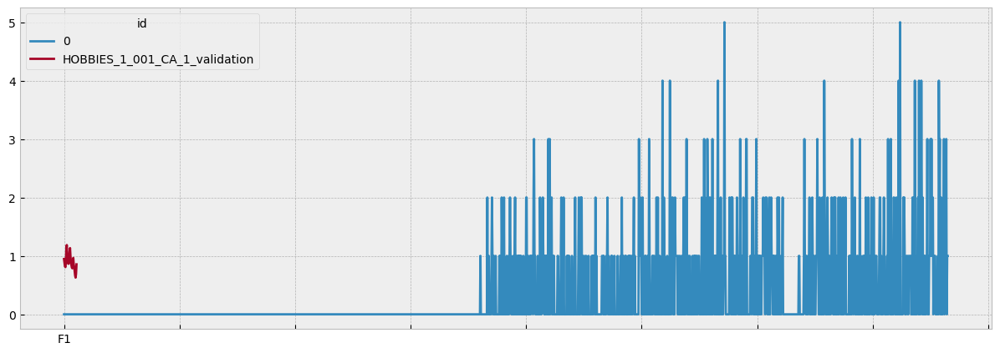

In [145]:
import time
import matplotlib.pyplot as plt

submission = pd.DataFrame(data=np.array(predictions).reshape(28,30490)).T
submission = pd.concat((submission, submission), ignore_index=True)

sample_submission = pd.read_csv('m5-forecasting-accuracy-data/sample_submission.csv')
idColumn = sample_submission[['id']]
submission[['id']] = idColumn

cols = list(submission.columns)
cols = cols[-1:] + cols[:-1]
submission = submission[cols]

colsdname = ['id'] + [f'F{i}' for i in range(1,29)]
submission.columns = colsdname

currrentDatTime = time.strftime('%d%m%Y_%H%M%S')

submission.to_csv('submission_LSTM.csv', index=False)

fig,axs = plt.subplots(figsize=(15, 5))
d_cols = [c for c in stv_data.columns if 'd_' in c]
stv_data[stv_data['id'] == 'HOBBIES_1_001_CA_1_validation'][d_cols].T.plot(ax=axs);
submission[submission['id'] == 'HOBBIES_1_001_CA_1_validation'].set_index('id').T.plot(ax=axs);

## LightGBM

In [75]:
# Reduce memory usage
CAL_COL_TYPES = {'event_name_1':'category', 'event_type_1':'category','event_name_2':'category', 'event_type_2':'category', 
            'weekday':'category', 'wm_yr_wk': 'int16', 'wday': 'int16', 'month': 'int16', 'year':'int16', 
            'snap_CA': 'float32', 'snap_TX': 'float32', 'snap_WI':'float32'}
SELLP_COL_TYPES = {'store_id':'category', 'item_id': 'category', 'wm_yr_wk': 'int16', 'sell_price':'float32'}

# Read the data
INPUT_DIR = 'm5-forecasting-accuracy-data/'
cal_data = pd.read_csv(INPUT_DIR + 'calendar.csv', dtype=CAL_COL_TYPES)
price_data = pd.read_csv(INPUT_DIR + 'sell_prices.csv', dtype=SELLP_COL_TYPES)

cal_data.loc[1913:]

,date,wm_yr_wk,weekday,wday,month,year,d,event_name_1,event_type_1,event_name_2,event_type_2,snap_CA,snap_TX,snap_WI
1913,2016-04-25,11613,Monday,3,4,2016,d_1914,NaN,NaN,NaN,NaN,0.0,0.0,0.0
1914,2016-04-26,11613,Tuesday,4,4,2016,d_1915,NaN,NaN,NaN,NaN,0.0,0.0,0.0
1915,2016-04-27,11613,Wednesday,5,4,2016,d_1916,NaN,NaN,NaN,NaN,0.0,0.0,0.0
1916,2016-04-28,11613,Thursday,6,4,2016,d_1917,NaN,NaN,NaN,NaN,0.0,0.0,0.0
1917,2016-04-29,11613,Friday,7,4,2016,d_1918,NaN,NaN,NaN,NaN,0.0,0.0,0.0
1918,2016-04-30,11614,Saturday,1,4,2016,d_1919,Pesach End,Religious,NaN,NaN,0.0,0.0,0.0
1919,2016-05-01,11614,Sunday,2,5,2016,d_1920,OrthodoxEaster,Religious,NaN,NaN,1.0,1.0,0.0
1920,2016-05-02,11614,Monday,3,5,2016,d_1921,NaN,NaN,NaN,NaN,1.0,0.0,1.0
1921,2016-05-03,11614,Tuesday,4,5,2016,d_1922,NaN,NaN,NaN,NaN,1.0,1.0,1.0
1922,2016-05-04,11614,Wednesday,5,5,2016,d_1923,NaN,NaN,NaN,NaN,1.0,0.0,0.0


In [79]:
print(price_data.shape)
price_data.head()

(6841121, 4)


,store_id,item_id,wm_yr_wk,sell_price
0,CA_1,HOBBIES_1_001,11325,9.58
1,CA_1,HOBBIES_1_001,11326,9.58
2,CA_1,HOBBIES_1_001,11327,8.26
3,CA_1,HOBBIES_1_001,11328,8.26
4,CA_1,HOBBIES_1_001,11329,8.26


In [84]:
max_lags = 57 # number of days to look back when predicting values
tr_last = 1913 # last training date
fday = datetime(2016, 4, 25)
fday

datetime.datetime(2016, 4, 25, 0, 0)

In [77]:
price_data.dtypes

store_id      category
item_id       category
wm_yr_wk         int16
sell_price     float32
dtype: object

In [80]:
def create_df(is_train=True, nrows=None, first_day=1200):
    # convert categorical column values to numerical values for sell_prices.csv, i.e., the first two columns
    price_data_change = price_data.copy()
    for col, col_dtype in SELLP_COL_TYPES.items():
        if col_dtype == 'category':
            price_data_change[col] = price_data_change[col].cat.codes.astype('int16')
            price_data_change[col] -= price_data_change[col].min()
    
    # convert categorical column values to numerical values for calendar.csv
    cal_data_change = cal_data.copy()
    cal_data_change['date'] = pd.to_datetime(cal_data_change['date'])
    for col, col_dtype in CAL_COL_TYPES.items():
        if col_dtype == 'category':
            cal_data_change[col] = cal_data_change[col].cat.codes.astype('int16')
            cal_data_change[col] -= cal_data_change[col].min()
            
    start_day = max(1 if is_train else tr_last-max_lags, first_day)
    dcols = [f'd_{day}' for day in range(start_day, tr_last+1)]
    catcols = ['id', 'item_id', 'dept_id', 'cat_id', 'store_id', 'state_id']
    dtype = {dcol : 'float32' for dcol in dcols}
    dtype.update({col:'category' for col in catcols if col!='id'})
    stv_data = pd.read_csv(INPUT_DIR + 'sales_train_validation.csv', nrows=nrows, usecols= catcols+dcols, dtype=dtype)   
    # convert categorical column values to numerical values for sales_train_validation.csv 
    for col in catcols:
        if col != 'id':
            stv_data[col] = stv_data[col].cat.codes.astype('int16')
            stv_data[col] -= stv_data[col].min()
    
    if not is_train:
        for day in range(tr_last+1, tr_last+28+1):
            salestv_data[f'd_{day}'] = np.nan
    
    # Unpivot the datafame along d_cols
    df = pd.melt(stv_data, 
                 id_vars=catcols, 
                 value_vars=[col for col in stv_data.columns if col.startswith('d_')],
                 var_name='d',
                 value_name='sales'
                )
    df = df.merge(cal_data_change, on='d', copy=False)
    df = df.merge(price_data_change, on=['store_id', 'item_id', 'wm_yr_wk'], copy=False)
    return df        

In [81]:
def create_fea(df):
    lags =[7, 28]
    lag_cols = [f'd_{lag}' for lag in lags]
    
    # shift the sales by lag value and append a new column
    for lag, lag_col in zip(lags, lag_cols):
        df[lag_col] = df[['id', 'sales']].groupby('id')['sales'].shift(lag)
        
    wins = [7, 28]
    for win in wins:
        for lag, lag_col in zip(lags, lag_cols):
            df[f'rmean_{lag}_{win}'] = df[['id', lag_col]].groupby('id')[lag_col].transform(lambda x: x.rolling(win).mean())
    
    date_features = {
        'wday': 'weekday',
        'week': 'weekofyear',
        'month': 'month',
        'quarter': 'quarter',
        'year': 'year',
        'mday': 'day'
    }
    
    # Add missing features of date in the dataframe & 
    # For the existing features changes their type to int16
    for date_feature_name, date_feature_func in date_features.items():
        if date_feature_name in df.columns:
            df[date_feature_name] = df[date_feature_name].astype('int16')
        else:
            df[date_feature_name] = getattr(df['date'].dt, date_feature_func).astype('int16')

In [82]:
FIRST_DAY=1

In [85]:
%%time

df = create_df(is_train=True, first_day = FIRST_DAY)
df.shape

CPU times: user 41 s, sys: 40.6 s, total: 1min 21s
Wall time: 1min 37s


(46027957, 22)

In [86]:
%%time

create_fea(df)
df.shape

/var/folders/8l/bxp0rg6s0250bdtld8bb_z840000gn/T/ipykernel_25068/1184485369.py:29: FutureWarning:

Series.dt.weekofyear and Series.dt.week have been deprecated. Please use Series.dt.isocalendar().week instead.



CPU times: user 2min 15s, sys: 45 s, total: 3min
Wall time: 3min 13s


(46027957, 31)

In [87]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 46027957 entries, 0 to 46027956
Data columns (total 31 columns):
 #   Column        Dtype         
---  ------        -----         
 0   id            object        
 1   item_id       int16         
 2   dept_id       int16         
 3   cat_id        int16         
 4   store_id      int16         
 5   state_id      int16         
 6   d             object        
 7   sales         float32       
 8   date          datetime64[ns]
 9   wm_yr_wk      int16         
 10  weekday       int16         
 11  wday          int16         
 12  month         int16         
 13  year          int16         
 14  event_name_1  int16         
 15  event_type_1  int16         
 16  event_name_2  int16         
 17  event_type_2  int16         
 18  snap_CA       float32       
 19  snap_TX       float32       
 20  snap_WI       float32       
 21  sell_price    float32       
 22  d_7           float32       
 23  d_28          float32       
 

In [88]:
df.head()

,id,item_id,dept_id,cat_id,store_id,state_id,d,sales,date,wm_yr_wk,...,sell_price,d_7,d_28,rmean_7_7,rmean_28_7,rmean_7_28,rmean_28_28,week,quarter,mday
0,HOBBIES_1_008_CA_1_validation,7,0,0,0,0,d_1,12.0,2011-01-29,11101,...,0.46,NaN,NaN,NaN,NaN,NaN,NaN,4,1,29
1,HOBBIES_1_008_CA_1_validation,7,0,0,0,0,d_2,15.0,2011-01-30,11101,...,0.46,NaN,NaN,NaN,NaN,NaN,NaN,4,1,30
2,HOBBIES_1_008_CA_1_validation,7,0,0,0,0,d_3,0.0,2011-01-31,11101,...,0.46,NaN,NaN,NaN,NaN,NaN,NaN,5,1,31
3,HOBBIES_1_008_CA_1_validation,7,0,0,0,0,d_4,0.0,2011-02-01,11101,...,0.46,NaN,NaN,NaN,NaN,NaN,NaN,5,1,1
4,HOBBIES_1_008_CA_1_validation,7,0,0,0,0,d_5,0.0,2011-02-02,11101,...,0.46,NaN,NaN,NaN,NaN,NaN,NaN,5,1,2


In [89]:
# Drop rows with missing value 
df.dropna(inplace=True)
df.shape

(44351007, 31)

In [90]:
cat_features = ['item_id', 'store_id', 'cat_id', 'dept_id', 'state_id'] + ['event_name_1', 'event_type_1', 'event_name_2', 'event_type_2']
useless_cols = ['id', 'date', 'sales', 'd', 'wm_yr_wk', 'weekday']
train_cols = df.columns[~df.columns.isin(useless_cols)]
X_train = df[train_cols]
y_train = df['sales']

In [91]:
%%time

np.random.seed(777)

# This is a random sample; not apply any time series train-test-split tricks here
fake_valid_inds = np.random.choice(X_train.index.values, 2_000_000, replace=False) # Validation dataset
train_inds = np.setdiff1d(X_train.index.values, fake_valid_inds) # Training dataset

train_data = lgb.Dataset(X_train.loc[train_inds], label=y_train.loc[train_inds], categorical_feature=cat_features, free_raw_data=False)
fake_valid_data = lgb.Dataset(X_train.loc[fake_valid_inds], label=y_train.loc[fake_valid_inds], categorical_feature=cat_features, free_raw_data=False)


CPU times: user 21.5 s, sys: 22.2 s, total: 43.7 s
Wall time: 57.9 s


In [92]:
del df, X_train, y_train, fake_valid_inds, train_inds; gc.collect()

20

In [93]:
# LGB parameters

params={
#    'device': 'gpu',
    'objective': 'poisson',
    'metric': ['rmse'],
    'force_row_wise': True,
    'learning_rate': 0.075,
    'sub_row': 0.75,
    'bagging_freq': 1,
    'lambda_12': 0.1,
    'verbosity': 1,
    'num_iterations': 1200,
    'num_leaves': 2**11-1,
    'min_data_in_leaf': 2**12-1
}

In [ ]:
%%time

m_lgb = lgb.train(params, train_data, valid_sets=[fake_valid_data], verbose_eval=20)

In [ ]:
m_lgb.save_model("model.lgb")

In [ ]:
%%time

alphas = [1.028, 1.023, 1.018]
weights = [1/len(alphas)] * len(alphas)
sub = 0.

for icount, (alpha, weight) in enumerate(zip(alphas, weights)):

    # create a dataframe that has values starting from tr_last-max_lags (1913 - 57) i.e, 57 days 
    # before the start of validation date
    te = create_df(False)
    cols = [f"F{i}" for i in range(1,29)]

    for tdelta in range(0, 28):
        day = fday + timedelta(days=tdelta)
        print(tdelta, day)
        # Create a dataframe starting from day to it's previous 57 days
        tst = te[(te.date >= day - timedelta(days=max_lags)) & (te.date <= day)].copy()
        create_fea(tst)
        # Make tst exactly the same format as used for training for model to predict values
        tst = tst.loc[tst.date == day , train_cols]
        # Add the predicted values of sales to the dataframe starting from firstday of validation
        te.loc[te.date == day, "sales"] = alpha*m_lgb.predict(tst) # magic multiplier by kyakovlev


    # Select and create a sub-df starting from validation day
    te_sub = te.loc[te.date >= fday, ["id", "sales"]].copy()
    
    # Number each item in each group from 0 to the length of that group - 1: cumcount()
    te_sub["F"] = [f"F{rank}" for rank in te_sub.groupby("id")["id"].cumcount()+1]
    
    # Unstack or pivot the values back to their original shape as per submission.csv
    te_sub = te_sub.set_index(["id", "F" ]).unstack()["sales"][cols].reset_index()
    
    #Replace all the Nan values to 0
    te_sub.fillna(0., inplace = True)
    
    te_sub.sort_values("id", inplace = True)
    te_sub.reset_index(drop=True, inplace = True)
    te_sub.to_csv(f"submission_{icount}.csv", index=False)
    # Create the weigted average value of sales
    if icount == 0 :
        sub = te_sub
        sub[cols] *= weight
    else:
        sub[cols] += te_sub[cols]*weight
    print(icount, alpha, weight)


sub2 = sub.copy()
sub2["id"] = sub2["id"].str.replace("validation$", "evaluation")
sub = pd.concat([sub, sub2], axis=0, sort=False)
sub.to_csv("submission.csv",index=False)

### Understand the prediction values 

In [ ]:
tst

In [ ]:
pp = te[(te.date >= (fday - timedelta(days=max_lags))) & (te.date <= fday)]
pp

In [ ]:
create_fea(pp)

In [ ]:
pp

In [ ]:
pp.loc[pp.date==fday, train_cols]

In [ ]:
%%time
pred = m_lgb.predict(tst)

In [ ]:
pred.shape

In [ ]:
te.loc[te.date==fday, 'sales'].shape

In [ ]:
sub = te.loc[te.date >= fday, ["id", "sales"]]

In [ ]:
sub["F"] = [f"F{rank}" for rank in sub.groupby("id")["id"].cumcount()+1]
sub = sub.set_index(['id','F'])
sub

In [ ]:
sub = sub.unstack()['sales'][cols].reset_index()
sub

In [ ]:
sub = sub.fillna(0.)
sub

In [ ]:
sub = sub.sort_values('id')
sub

In [ ]:
sub.reset_index(drop=True)

### Intuition behind using lags and rolling window in the model

(remember index starts from 0 and for simplicity a month is 28 days)

**First off what each feature mathematically does**

**lag_7:** sales shifted 7 steps downwards for each group. The example above focuses on one group only as an example. That is why the first value appears on the 7th index.
**lag_28:** sales shifted 28 steps downwads. That is why the first value appears on the 28th index.
**rmean_7_7:** rolling mean sales of a window size of 7 over column lag_7. First value (0.2857) appears on the 13th index because means including nan are nan.
**rmean_7_28:** rolling mean sales of a window size of 7 over column lag_28. First value (0.357) appears on the 34th index because that is the first time the mean formula gets all 7 non-nan values.
**rmean_28_7:** rolling mean sales of a window size of 28 over column lag_7. First value (0.2857) appears on the 3th index because it is the first time the mean formula gets 28 non-nan values.
**rmean_28_28:** rolling mean sales of a window size of 28 over column lag_28. First value appears on 55th index because that is the first time the formula here all non-nan values.

**The intuition as far as I can understand is the following:**

1. Captures the week-on-week similarity and that too of just the past week. In other words, people are likely to shop this monday similar to the last monday (except it is some special occassion).
2. Captures the weekly similarity from a month-to-month perspective. Example: people in the 1st weekend of a month shop more so that weekend looks more similar to first weeks of other months than the previous weekend. (Though 28 is arguable here. A month is generally 30. Interesting would be a variable window depending on when the comparative week starts. Dealing with edge cases like week divided into 2 months will be tricky).

**Since individual data points are prone to erratic spikes or troughs, mean provides a more "representative" picture.**

3. Captures the information regarding the sales of the whole previous week ending 7 days in the past i.e. if we are at day 14, then the average is of sales from days 1-7 NOT days 7-14. This provides the information about the whole week and not just a single day sale comparison like lag_7 to bring the lag_7 value into "better weekly context".

4. Captures the information regarding the sales of the entire previous 4 weeks ending 7 days in the past i.e. if we are at day 35, then the average is sales from days 1-28.

5. Captures the information regarding the sales of the whole week ending 4 weeks ago i.e. if we are on day 35, then the average is of sales from day 1-7. (Assuming for simplicity the month is 28 days), this provides the information of not just a month-to-month comparison of the same day (day 7 of month one vs day 7 of month two), but the entire week leading up to day 7. Again the idea I believe is to capture the whole week and not just a single day sale comparison like lag_28 to bring the lag_28 value into "better weekly context".

6. Captures the information regarding the sales of the entire previous 4 weeks ending 4 weeks in the past i.e. if we are at day 56, then the average is of days 1-28. (Assuming for simplicity the month is 28 days), the idea again is to bring the point value of lag_28 into a better context (i.e. of day 28 when being compared to day 56) into a "better monthly context".

**How would you "talk" about these features?**

To see how the sales were last friday compared to this friday, how the sales were first weekend of the last month compared to first weekend of this month. May be comparing last saturday to this saturday is too specific. Week-on-week same day trends are more likely to be similar if the prior week went similar too. It would make sense to not just have the last saturday but also the mean of the whole week leading upto that day to give the model the "hint" how normal the whole week was.